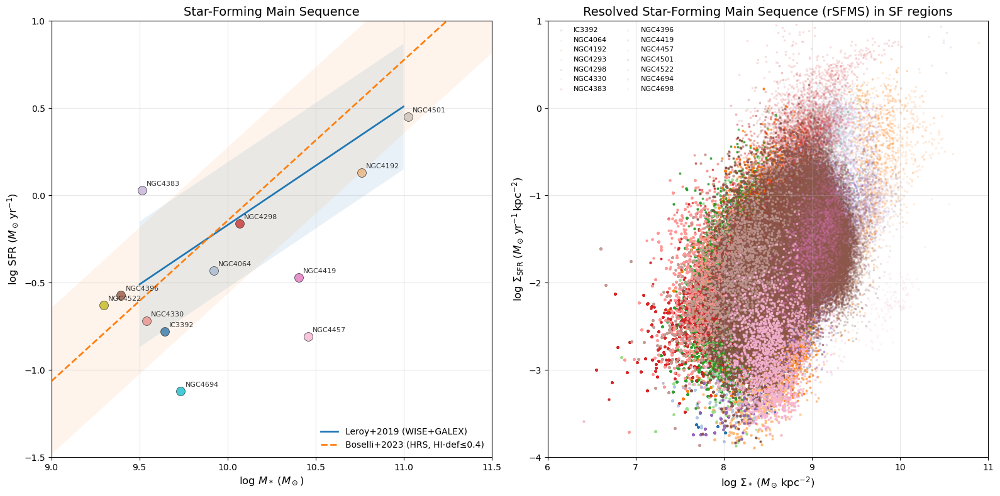

Subplot 1: Plotted 14 galaxies with valid total mass and SFR data
Subplot 2: Plotted spatially-resolved data for 14 galaxies


In [1]:
# ------------------------------------------------------------------
# Combined Plot: Total SFMS + Spatially-resolved Star Formation
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import re
import itertools
from scipy.stats import linregress
from astropy.io import fits

# Create figure with 2 subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

# ------------------------------------------------------------------
# SUBPLOT 1: Total Stellar Mass vs Total SFR from log files
# ------------------------------------------------------------------

# Extraction functions for log files
def extract_total_stellar_mass(galaxy_name):
    """Extract total stellar mass from mass log file. Returns log10(M☉) value or None if not found."""
    log_file = Path(f'mass_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total stellar mass \(R\)\s*:\s*([\d.-]+)\s*log10\(M☉\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading mass log for {galaxy_name}: {e}")
        return None

def extract_total_sfr(galaxy_name):
    """Extract total SFR from SFR log file. Returns log10(M☉/yr) value or None if not found."""
    log_file = Path(f'sfr_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total Halpha SFR from SF region:.*?in log10 scale:\s*([\d.-]+)\s*log\(M☉/yr\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading SFR log for {galaxy_name}: {e}")
        return None

def sfms_leroy2019(logM, scatter=0.36, valid=(9.5, 11.0)):
    """Leroy+2019 eq.19 converted to log SFR: logSFR = 0.68*logM - 6.97."""
    y = 0.68 * np.asarray(logM) - 6.97
    # mask outside their stated mass range
    y = np.where((logM < valid[0]) | (logM > valid[1]), np.nan, y)
    return y

def sfms_boselli2023(logM, slope=0.92, intercept=-1.57, x_pivot=8.451, scatter=0.42):
    """
    Boselli+2023 (HRS, HI-def ≤ 0.4): fit with pivot x_pivot.
    y = slope * (logM - x_pivot) + intercept
    """
    logM = np.asarray(logM)
    y = slope * (logM - x_pivot) + intercept
    return y

# Discover galaxies
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]

# Extract total masses and SFRs
log_masses = []
log_sfrs = []
galaxy_names = []

for gal in galaxies:
    mass = extract_total_stellar_mass(gal)
    sfr = extract_total_sfr(gal)
    
    if mass is not None and sfr is not None:
        log_masses.append(mass)
        log_sfrs.append(sfr)
        galaxy_names.append(gal)

# Convert to numpy arrays
log_masses = np.array(log_masses)
log_sfrs = np.array(log_sfrs)

# Color-code each galaxy
colors_total = plt.cm.tab20(np.linspace(0, 1, len(galaxy_names)))

# Plot points and add galaxy names as annotations
for i, (mass, sfr, gal) in enumerate(zip(log_masses, log_sfrs, galaxy_names)):
    # Plot the point
    ax1.scatter(mass, sfr, s=100, c=[colors_total[i]], alpha=0.8, 
               edgecolors='black', linewidth=0.5)
    
    # Add galaxy name as annotation with slight offset
    ax1.annotate(gal, (mass, sfr), xytext=(5, 5), textcoords='offset points', 
                fontsize=8, alpha=0.8)

# Add labels and formatting for subplot 1
ax1.set_xlabel(r'$\log\,M_* \; (M_\odot)$', fontsize=12)
ax1.set_ylabel(r'$\log\,\mathrm{SFR} \; (M_\odot\,\mathrm{yr}^{-1})$', fontsize=12)
ax1.set_title('Star-Forming Main Sequence', fontsize=14)
ax1.grid(True, alpha=0.3)
ax1.set_xlim(9, 11.5)
ax1.set_ylim(-1.5, 1)

# Add SFMS relations
x_line = np.linspace(*ax1.get_xlim(), 400)

# Leroy+2019 line + ±0.36 dex band
y_l19 = sfms_leroy2019(x_line)
ax1.plot(x_line, y_l19, lw=2, ls='-', label='Leroy+2019 (WISE+GALEX)')
ax1.fill_between(x_line, y_l19 - 0.36, y_l19 + 0.36, alpha=0.10, linewidth=0)

# Boselli+2023 line + intrinsic-scatter band
y_b23 = sfms_boselli2023(x_line)
ax1.plot(x_line, y_b23, lw=2, ls='--', label='Boselli+2023 (HRS, HI-def≤0.4)')
ax1.fill_between(x_line, y_b23 - 0.42, y_b23 + 0.42, alpha=0.08, linewidth=0)

# Add legend for SFMS relations
ax1.legend(frameon=False, fontsize=10, loc='lower right')

# ------------------------------------------------------------------
# SUBPLOT 2: Spatially-resolved Σ* vs ΣSFR
# ------------------------------------------------------------------

# Colour cycle for spatially-resolved plot
colors_spatial = itertools.cycle(plt.get_cmap('tab20').colors)

# Collect all data points for global fit
all_x = []
all_y = []

for gal, colour in zip(galaxies, colors_spatial):
    bin_file = Path(f'{gal}_SPATIAL_BINNING_maps_extended.fits')
    gas_file = Path(f'{gal}_gas_BIN_maps_extended.fits')
    
    if not bin_file.exists() or not gas_file.exists():
        continue

    # Read FITS extensions
    try:
        with fits.open(bin_file) as hdul:
            logSigmaM = hdul['LOGMASS_SURFACE_DENSITY'].data  # Σ*
        with fits.open(gas_file) as hdul:
            logSigmaSFR = hdul['LOGSFR_SURFACE_DENSITY_SF'].data  # Σ_SFR

        # Mask bad pixels
        good = np.isfinite(logSigmaM) & np.isfinite(logSigmaSFR)

        # Scatter plot
        ax2.scatter(
            logSigmaM[good],
            logSigmaSFR[good],
            s=1, 
            marker=',', 
            alpha=0.1,
            color=colour,
            label=gal
        )
        
        # Collect points for global fit
        all_x.extend(logSigmaM[good])
        all_y.extend(logSigmaSFR[good])
        
    except Exception as e:
        print(f"Error processing {gal}: {e}")
        continue

# Final cosmetics for subplot 2
ax2.set_xlabel(r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=12)
ax2.set_ylabel(r'$\log\,\Sigma_{\mathrm{SFR}}\; (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$', fontsize=12)
ax2.set_title(r'Resolved Star-Forming Main Sequence (rSFMS) in SF regions', fontsize=14)
ax2.set_xlim(6, 11)
ax2.set_ylim(-4, 1)
ax2.grid(True, alpha=0.3)
ax2.legend(frameon=False, fontsize=8, loc='upper left', ncol=2)

plt.tight_layout()
plt.show()

print(f"Subplot 1: Plotted {len(galaxy_names)} galaxies with valid total mass and SFR data")
print(f"Subplot 2: Plotted spatially-resolved data for {len([g for g in galaxies if Path(f'{g}_SPATIAL_BINNING_maps_extended.fits').exists()])} galaxies")

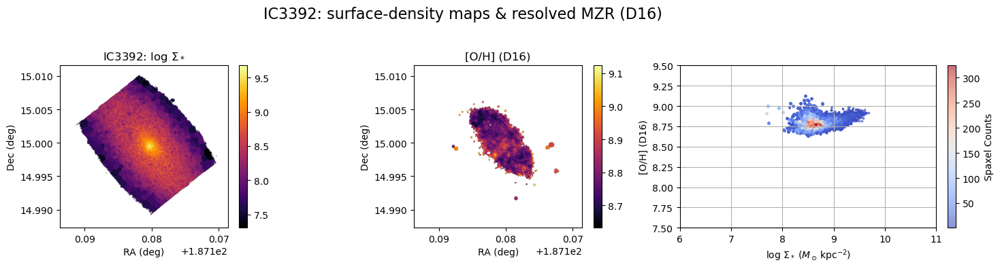

In [2]:
import itertools
import matplotlib.pyplot as plt
from pathlib import Path
import numpy as np
from astropy.io import fits
from astropy.wcs import WCS
from matplotlib.gridspec import GridSpec
import astropy.units as u

# ------------------------------------------------------------------
# 0.  List galaxies and pin one colour to each
# ------------------------------------------------------------------
bin_maps = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
# galaxies = [f.name.split('_')[0] for f in bin_maps]        # auto-detect
galaxies =  ['IC3392', ]  # manual list
cmap   = plt.get_cmap('tab20').colors                      # 20 hues
colour = {g: cmap[i % len(cmap)] for i, g in enumerate(galaxies)}

# ------------------------------------------------------------------
# 1.  Helper: read the two maps
# ------------------------------------------------------------------
def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
        wcs = WCS(h['LOGMASS_SURFACE_DENSITY'].header)
        mass_header = h['LOGMASS_SURFACE_DENSITY'].header
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR = h['LOGSFR_SURFACE_DENSITY_SF'].data
        gas_header = h['LOGSFR_SURFACE_DENSITY_SF'].header
        oh_d16 = h['O_H_D16_SF'].data
    return sigM, sigSFR, wcs, mass_header, gas_header, oh_d16

# ------------------------------------------------------------------
# 2.  One figure (3 panels) per galaxy - MZR version
# ------------------------------------------------------------------
for gal in galaxies:
    sigM, sigSFR, wcs, mass_header, gas_header, oh_d16 = load_maps(gal)
    good = np.isfinite(sigM) & np.isfinite(oh_d16)
    x, y = sigM[good], oh_d16[good]

    # Convert pixel area to physical area in pc²
    legacy_wcs2 = WCS(gas_header).celestial  # strip spectral axis
    
    # Get the extent from WCS for proper coordinate axes
    y_size, x_size = sigM.shape
    x_coords = np.arange(x_size)
    y_coords = np.arange(y_size)
    xx, yy = np.meshgrid(x_coords, y_coords)
    # Convert pixel coordinates to world coordinates
    ra, dec = legacy_wcs2.pixel_to_world_values(xx, yy)
    extent = [ra.max(), ra.min(), dec.min(), dec.max()]  # [left, right, bottom, top]

    fig = plt.figure(figsize=(16, 4))

    # --- Σ* map ---------------------------------------------------
    axM = fig.add_subplot(1, 3, 1)
    im1 = axM.imshow(sigM, origin='lower', cmap='inferno', extent=extent)
    axM.set_title(rf'{gal}: $\log\,\Sigma_*$')
    axM.set_xlabel('RA (deg)')
    axM.set_ylabel('Dec (deg)')
    fig.colorbar(im1, ax=axM, fraction=0.046, pad=0.04)

    # --- [O/H] D16 map --------------------------------------------
    axOH = fig.add_subplot(1, 3, 2)
    im2 = axOH.imshow(oh_d16, origin='lower', cmap='inferno', extent=extent)
    axOH.set_title(r'[O/H] (D16)')
    axOH.set_xlabel('RA (deg)')
    axOH.set_ylabel('Dec (deg)')
    fig.colorbar(im2, ax=axOH, fraction=0.046, pad=0.04)

    # --- rMZR scatter with density color coding ------------------
    axMZR = fig.add_subplot(1, 3, 3)  # No WCS projection for scatter plot
    
    # Create 2D histogram for density calculation
    H, xedges, yedges = np.histogram2d(x, y, bins=100, range=[[6, 11], [7.5, 9.5]])
    
    # Find bin indices for each point
    x_idx = np.digitize(x, xedges) - 1
    y_idx = np.digitize(y, yedges) - 1
    
    # Clip indices to valid range
    x_idx = np.clip(x_idx, 0, H.shape[0] - 1)
    y_idx = np.clip(y_idx, 0, H.shape[1] - 1)
    
    # Get density for each point
    density = H[x_idx, y_idx]
    
    # Create scatter plot colored by density
    scatter = axMZR.scatter(x, y, c=density, s=2, alpha=0.6, marker=',', cmap='coolwarm')
    axMZR.set_xlabel(r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$')
    axMZR.set_ylabel(r'[O/H] (D16)')
    axMZR.set_xlim(6, 11)
    axMZR.set_ylim(7.5, 9.5)
    axMZR.grid(True)
    
    # Add colorbar for density
    fig.colorbar(scatter, ax=axMZR, fraction=0.046, pad=0.04, label='Spaxel Counts')

    fig.suptitle(f'{gal}: surface-density maps & resolved MZR (D16)', fontsize=16)
    fig.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

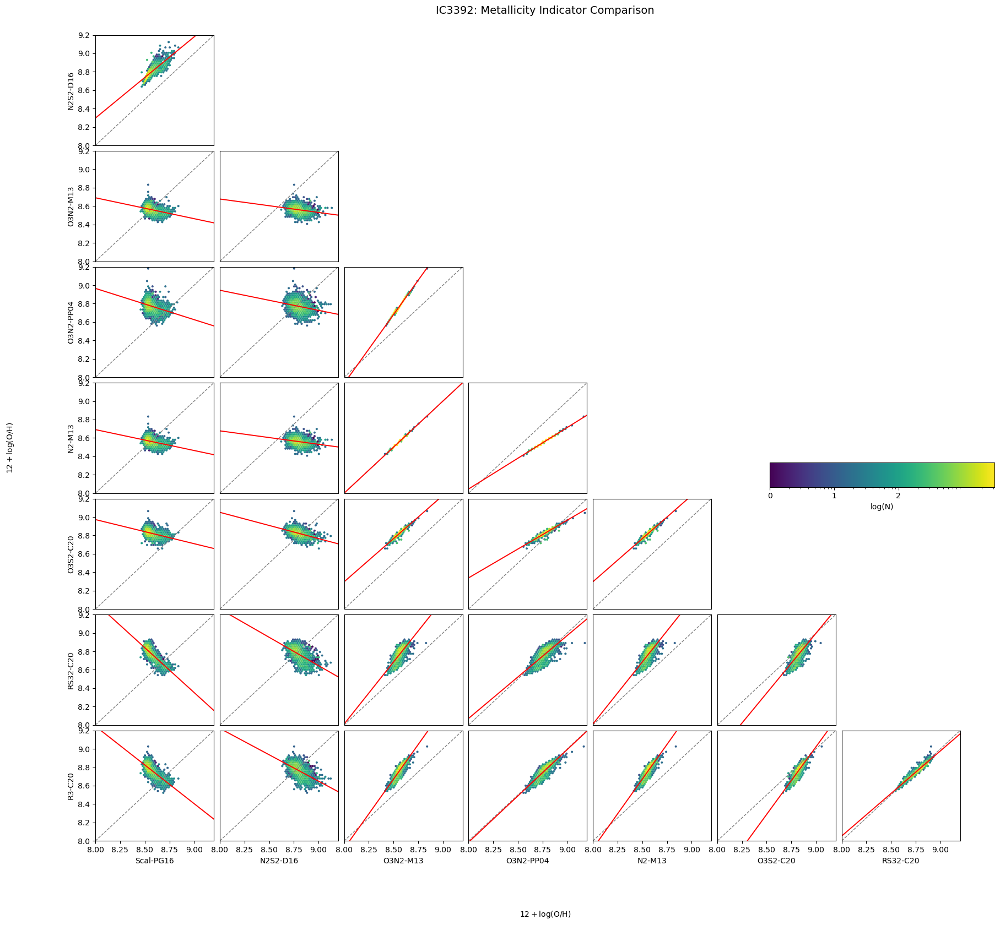

In [3]:
#!/usr/bin/env python3
# IC3392: lower-triangle comparison across metallicity prescriptions
# - Layout/order matches your attached figure
# - No file saved; just displays the figure
# - Uses hexbin density, shared colorbar labeled log(N)
# - 1:1 dashed line + red linear fit in each populated panel

import re
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from astropy.io import fits
from scipy.stats import linregress

gal = "IC3392"

# ---------- helpers ----------
def _norm(s: str) -> str:
    return re.sub(r"[^A-Z0-9]", "", str(s).upper())

def find_gas_fits(gal: str) -> Path:
    pats = [
        f"{gal}_gas_BIN_maps_extended.fits",
        f"{gal}*gas*BIN*maps*extended*.fits",
        f"{gal}*gas*maps*extended*.fits",
        f"{gal}*gas*maps*.fits",
    ]
    for pat in pats:
        for p in sorted(Path(".").glob(pat)):
            try:
                with open(p, "rb") as f:
                    if f.read(8).startswith(b"SIMPLE  "):
                        return p
            except Exception:
                pass
    raise FileNotFoundError("Could not find a valid gas FITS file for " + gal)

def find_hdu_name(hdul, tokens, prefer_sf=True):
    toks_all = [_norm(t) for t in tokens]
    toks_sf  = toks_all + (["SF"] if prefer_sf and "SF" not in toks_all else [])
    # try with SF
    for h in hdul:
        nm = _norm(h.name or "")
        if nm and all(t in nm for t in toks_sf):
            return h.name
    # fallback without SF
    for h in hdul:
        nm = _norm(h.name or "")
        if nm and all(t in nm for t in toks_all):
            return h.name
    return None

def ensure_found(hdul, tokens):
    name = find_hdu_name(hdul, tokens, prefer_sf=True)
    # Accept RS32 vs R3S2
    if name is None and any(_norm(t) == "R3S2" for t in tokens):
        alt = ["RS32" if _norm(t) == "R3S2" else t for t in tokens]
        name = find_hdu_name(hdul, alt, prefer_sf=True)
    return name

# ---------- the exact order you asked for ----------
x_labels = ["Scal-PG16", "N2S2-D16", "O3N2-M13", "O3N2-PP04", "N2-M13", "O3S2-C20", "RS32-C20", "R3-C20"]
y_labels = x_labels[1:]  # remove the first; lower-triangle grid

# tokens for fuzzy EXTNAME matching
tokens_map = {
    "Scal-PG16":  ["O_H", "PG16"],
    "N2S2-D16":   ["O_H", "D16"],
    "O3N2-M13":   ["O_H", "M13",  "O3N2"],
    "O3N2-PP04":  ["O_H", "PP04", "O3N2"],
    "N2-M13":     ["O_H", "M13",  "N2"],
    "O3S2-C20":   ["O_H", "C20",  "O3S2"],
    "RS32-C20":   ["O_H", "C20",  "R3S2"],   # RS32 synonym handled
    "R3-C20":     ["O_H", "C20",  "R3"],
}

# ---------- load maps ----------
fits_path = find_gas_fits(gal)
with fits.open(fits_path) as hdul:
    maps = {}
    for lab in x_labels:
        name = ensure_found(hdul, tokens_map[lab])
        if name is None:
            raise KeyError(f"Could not find HDU for {lab} (tokens={tokens_map[lab]})")
        arr = hdul[name].data
        if arr is None:
            raise ValueError(f"HDU {name} for {lab} has no data")
        maps[lab] = np.asarray(arr, dtype=float)

# global nice limits (robust) shared by all panels
all_vals = np.concatenate([np.ravel(m[np.isfinite(m)]) for m in maps.values()])
if all_vals.size:
    Zmin, Zmax = 8.0, 9.2

nx = len(x_labels)
ny = len(y_labels)

# Create figure with minimal spacing between subplots
fig, axes = plt.subplots(ny, nx, figsize=(2.55*nx, 2.55*ny))
if ny == 1:
    axes = np.array([axes])  # ensure 2D

norm = LogNorm(vmin=1)
cmap = plt.get_cmap("viridis")
max_count = 1

for i, yl in enumerate(y_labels):      # rows (y-variable)
    for j, xl in enumerate(x_labels):  # cols (x-variable)
        ax = axes[i, j]
        if j > i:          # ensure lower triangle (including first column)
            ax.remove()  # Remove unused axes completely
            continue

        x = maps[xl]; y = maps[yl]
        good = np.isfinite(x) & np.isfinite(y)
        xv = x[good].ravel(); yv = y[good].ravel()
        sel = (xv >= Zmin) & (xv <= Zmax) & (yv >= Zmin) & (yv <= Zmax)
        xv, yv = xv[sel], yv[sel]

        if xv.size == 0:
            ax.remove()  # Remove empty axes
            continue

        hb = ax.hexbin(
            xv, yv, gridsize=55, extent=(Zmin, Zmax, Zmin, Zmax),
            mincnt=1, linewidths=0.0, norm=norm, cmap=cmap
        )
        if hb.get_array().size:
            max_count = max(max_count, float(hb.get_array().max()))

        # 1:1 dashed
        ax.plot([Zmin, Zmax], [Zmin, Zmax], ls="--", lw=1, color="0.5")

        # Linear fit (red)
        try:
            slope, intercept, *_ = linregress(xv, yv)
            xx = np.linspace(Zmin, Zmax, 200)
            ax.plot(xx, intercept + slope*xx, color="red", lw=1.4)
        except Exception:
            pass

        ax.set_xlim(Zmin, Zmax)
        ax.set_ylim(Zmin, Zmax)
        ax.grid(False)

        # Minimal ticks and labels for interior plots
        if j == 0:
            ax.set_ylabel(yl, fontsize=10)
        else:
            ax.set_yticklabels([])
            ax.tick_params(left=False)  # Remove tick marks
        if i == ny - 1:
            ax.set_xlabel(xl, fontsize=10)
        else:
            ax.set_xticklabels([])
            ax.tick_params(bottom=False)  # Remove tick marks

# Add title
fig.suptitle('IC3392: Metallicity Indicator Comparison', fontsize=14, y=0.95)

# Global axis titles with adjusted positions
fig.text(0.5, 0.02, r"$12+\log(\mathrm{O/H})$", ha="center", va="bottom")
fig.text(0.02, 0.5, r"$12+\log(\mathrm{O/H})$", ha="left", va="center", rotation="vertical")

# Shared horizontal colorbar with adjusted position
from matplotlib.cm import ScalarMappable
mappable = ScalarMappable(norm=LogNorm(vmin=1, vmax=max_count), cmap=cmap)
cax = fig.add_axes([0.70, 0.46, 0.20, 0.025])  # [left, bottom, width, height]
cb = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cb.set_label("log(N)")
cb.set_ticks([1, 10, 100])
cb.set_ticklabels(["0", "1", "2"])

# Tighter layout with space for title and labels
plt.subplots_adjust(left=0.1, right=0.98, bottom=0.1, top=0.92, wspace=0.05, hspace=0.05)
plt.show()

Processing IC3392...


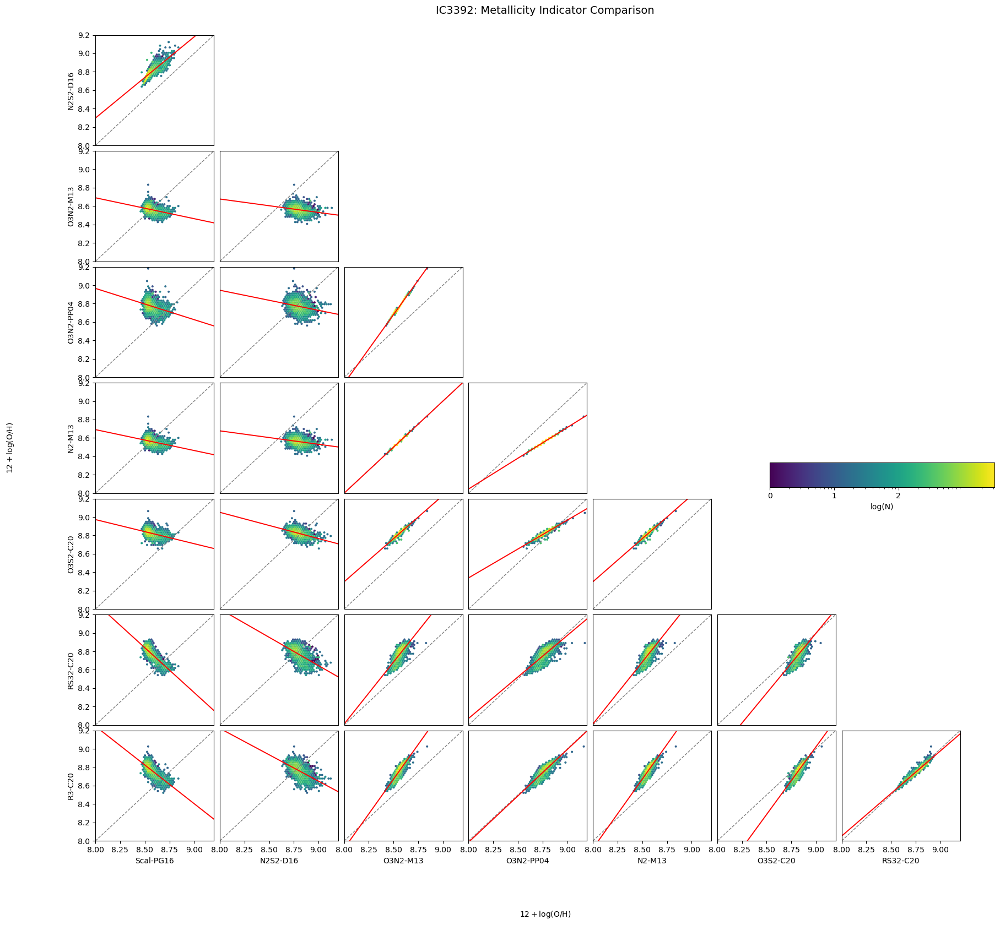

Processing NGC4064...


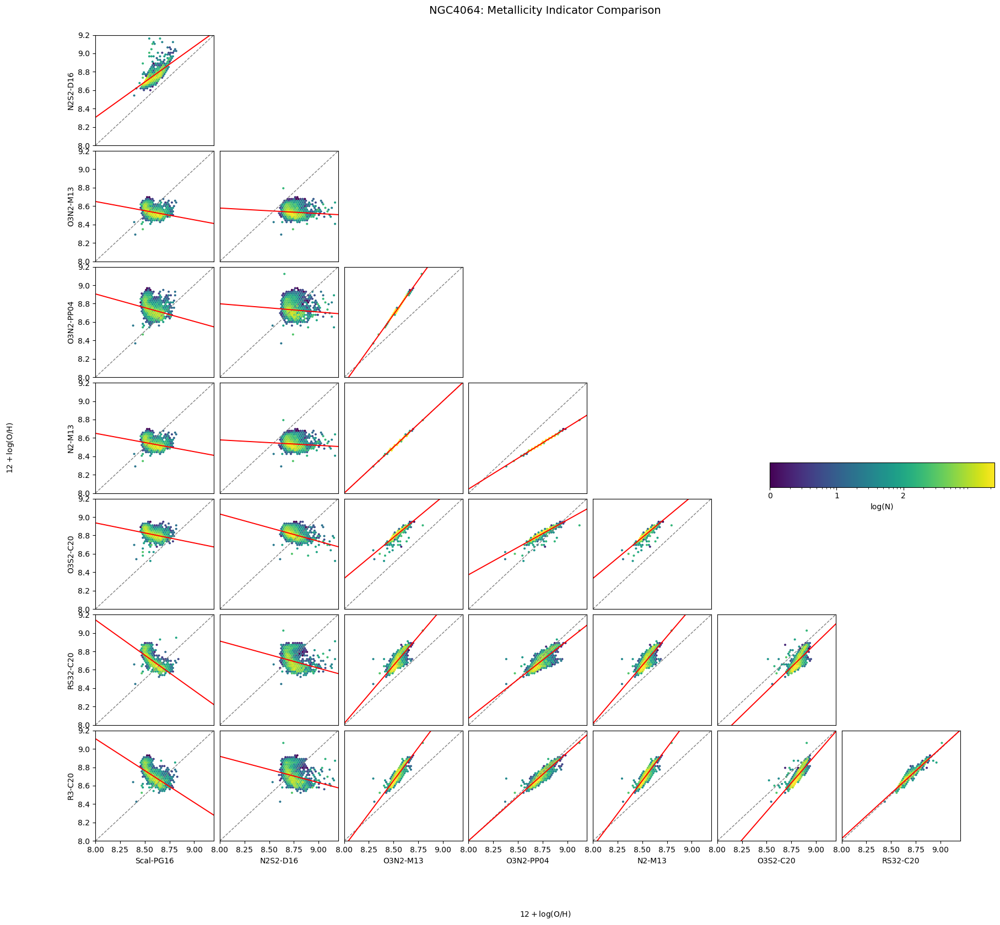

Processing NGC4192...


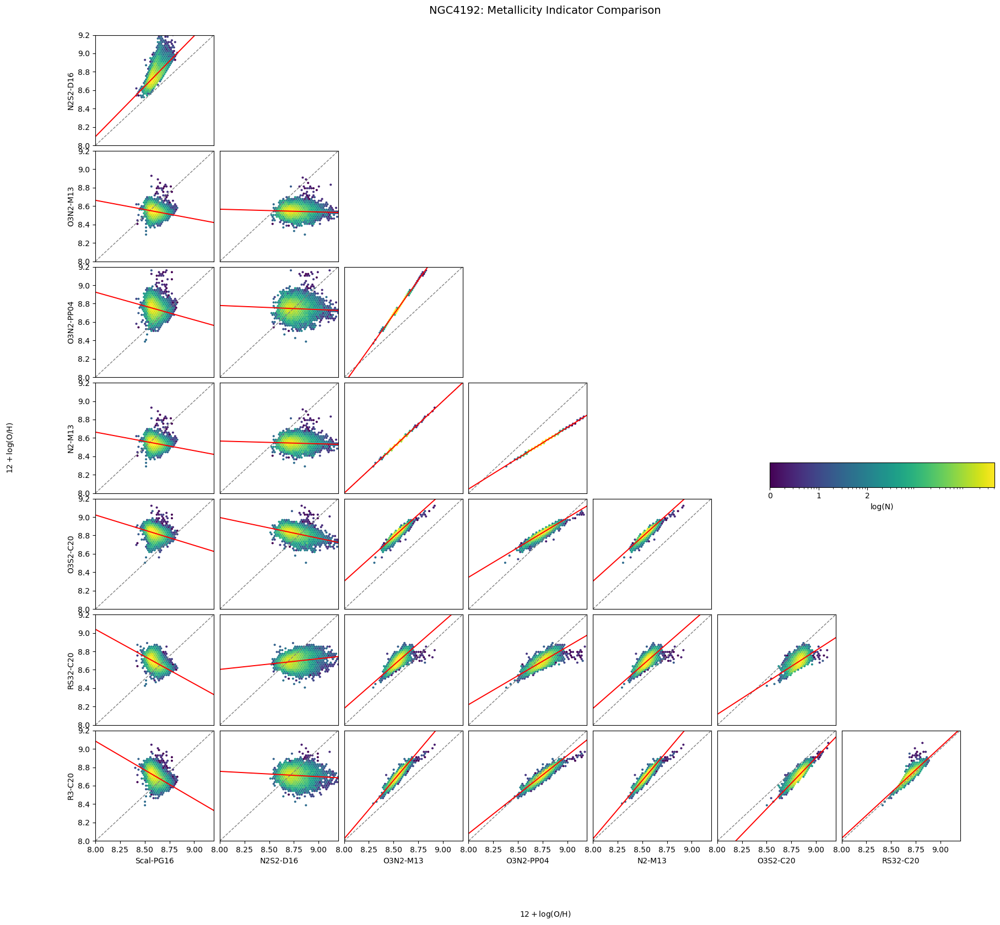

Processing NGC4293...


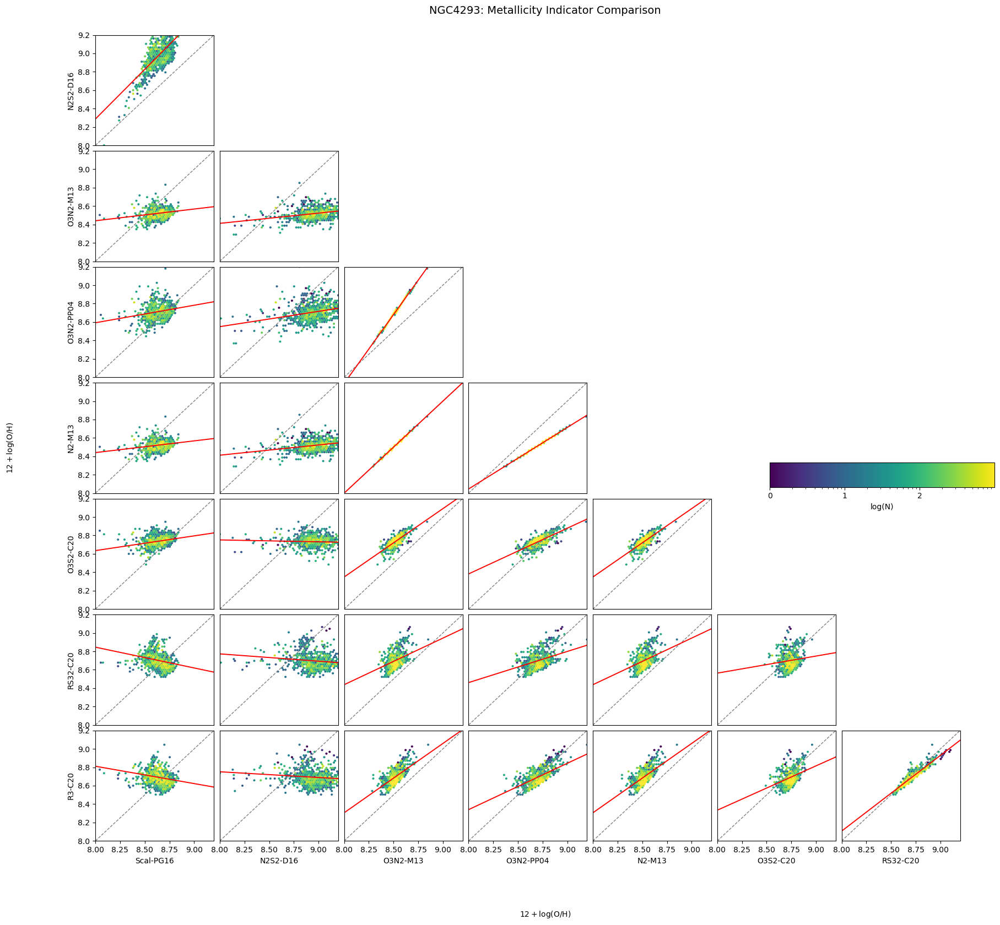

Processing NGC4298...


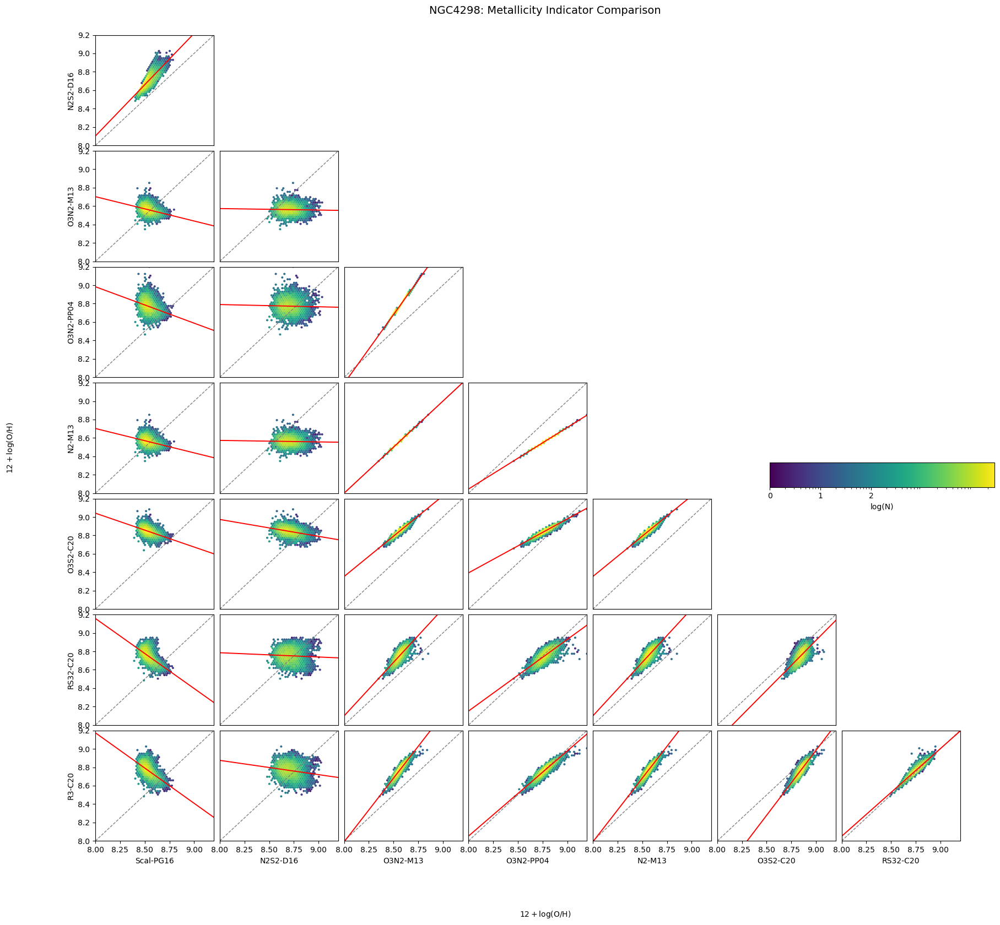

Processing NGC4330...


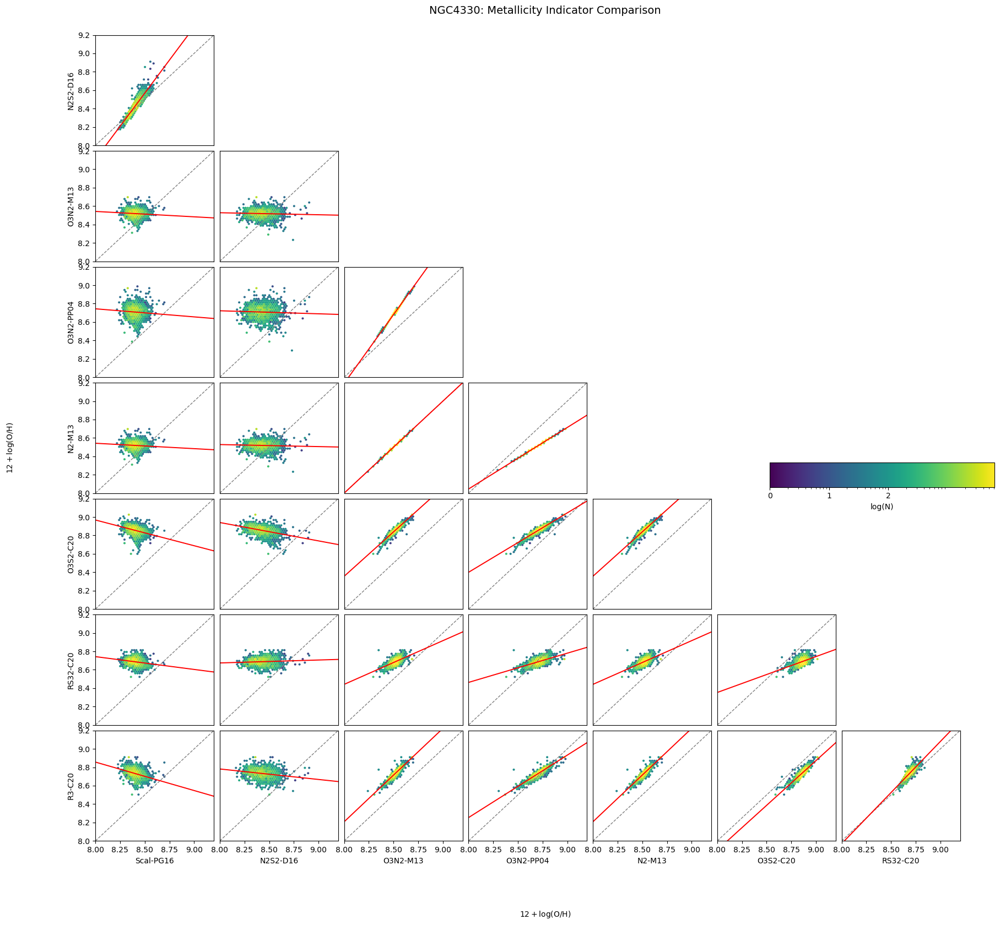

Processing NGC4383...


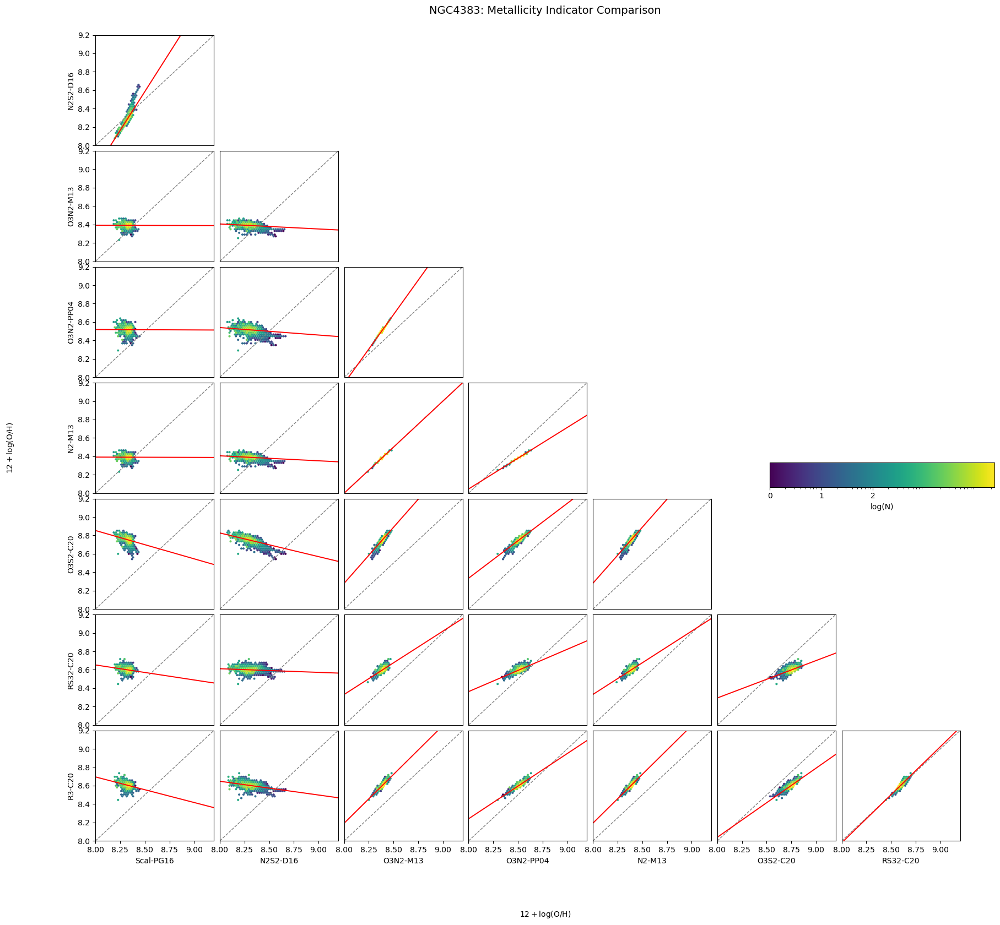

Processing NGC4396...


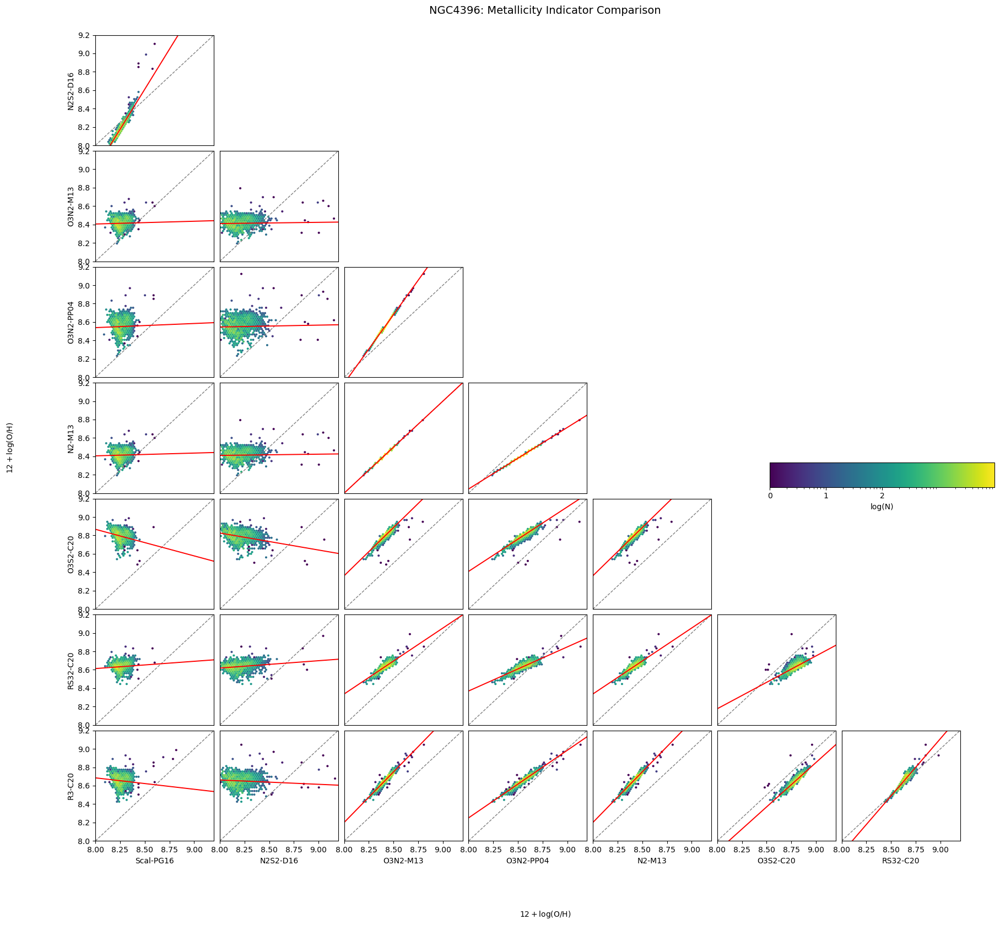

Processing NGC4419...


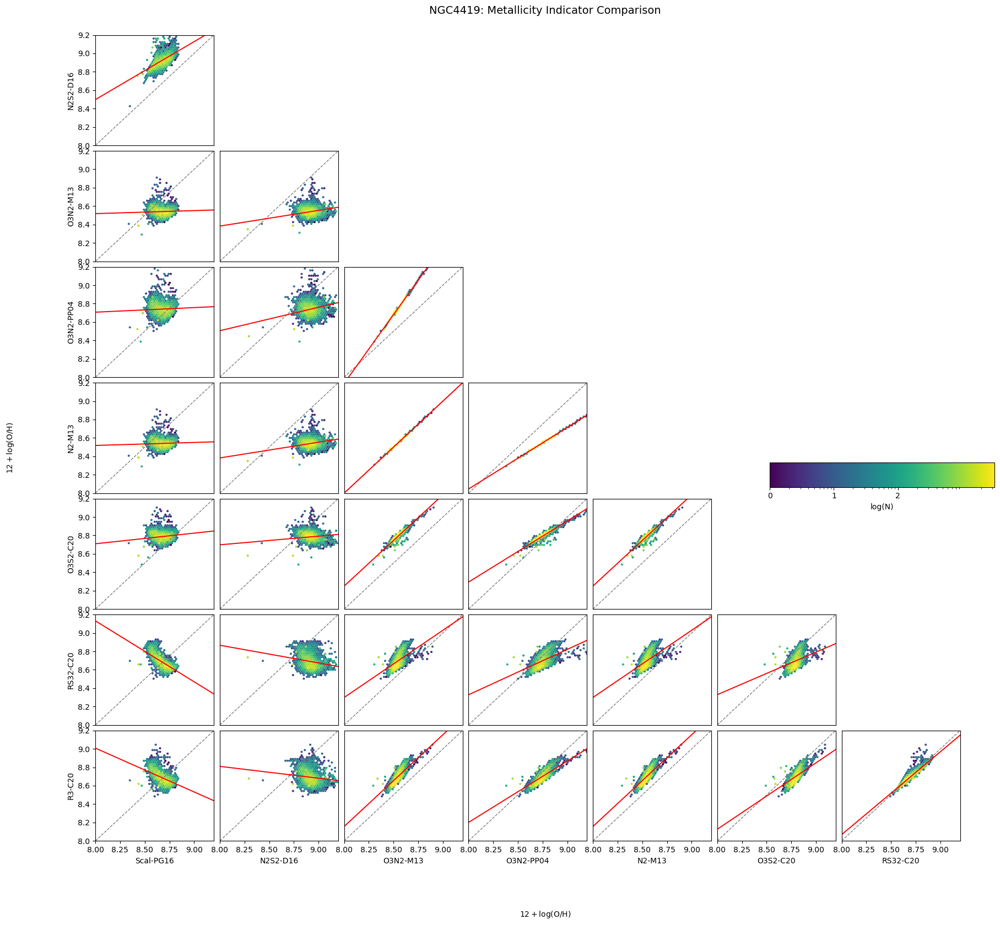

Processing NGC4457...


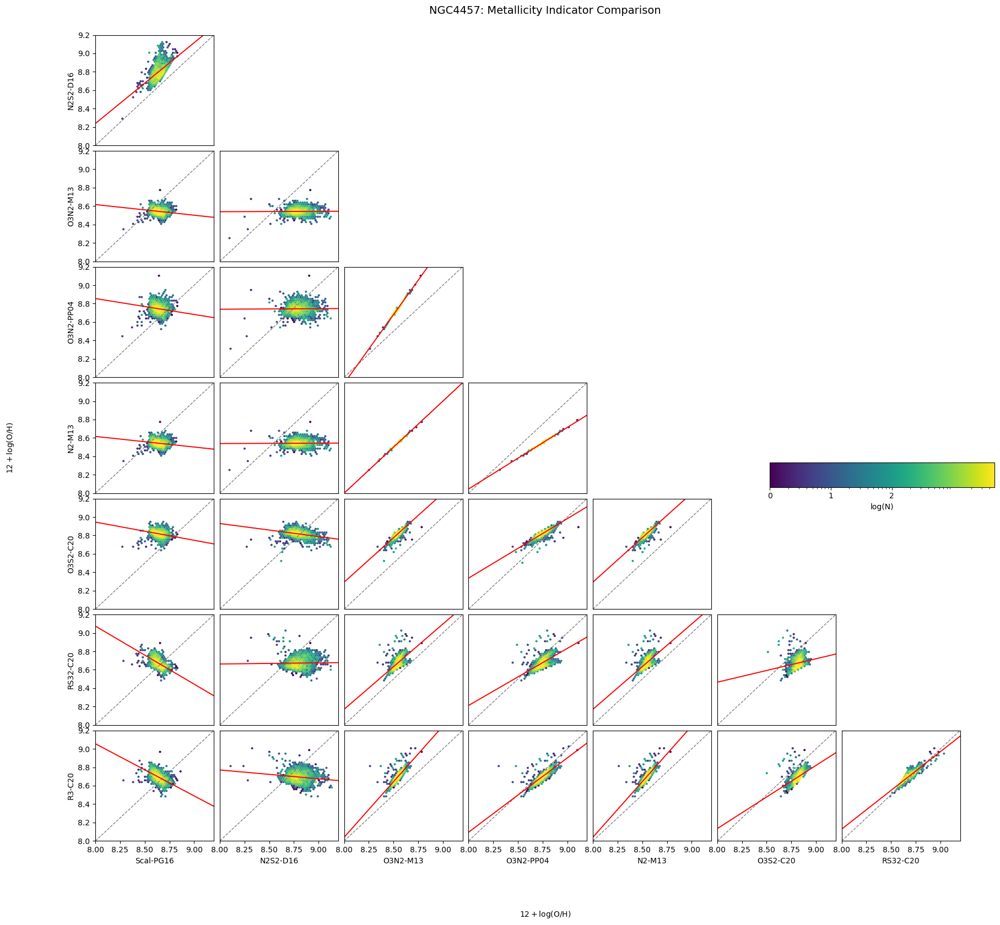

Processing NGC4501...


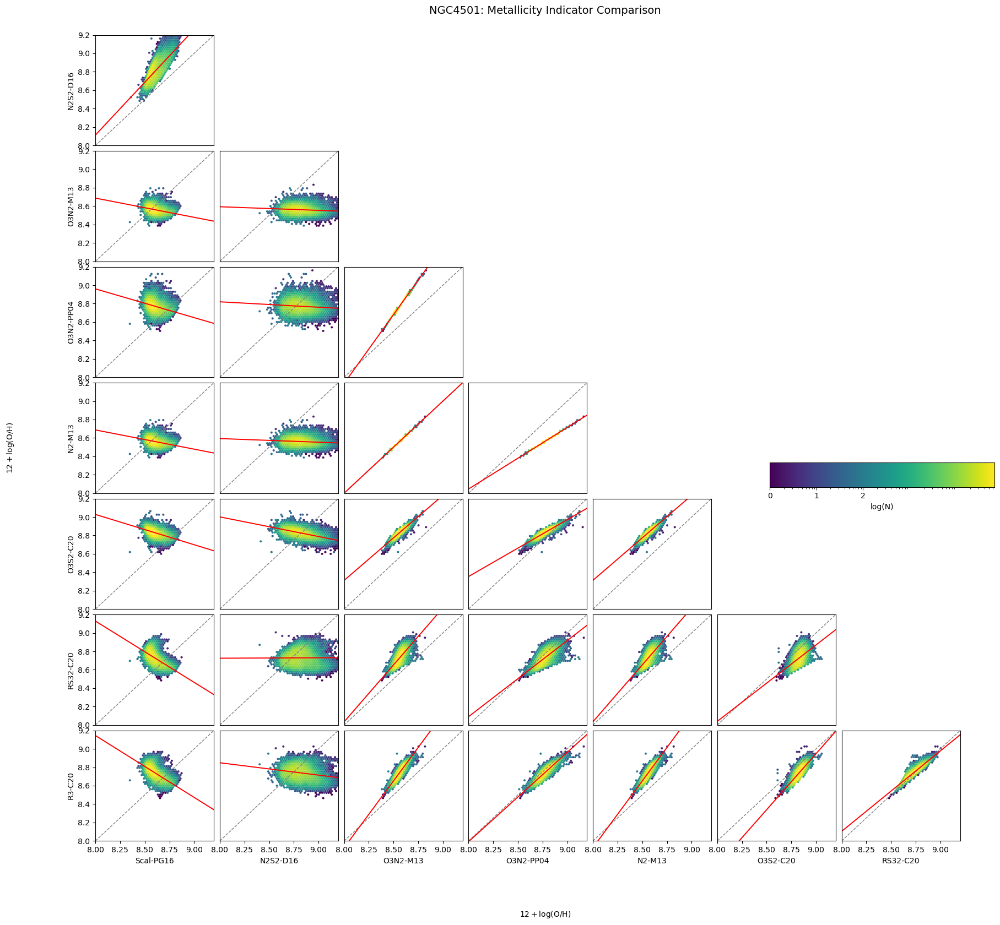

Processing NGC4522...


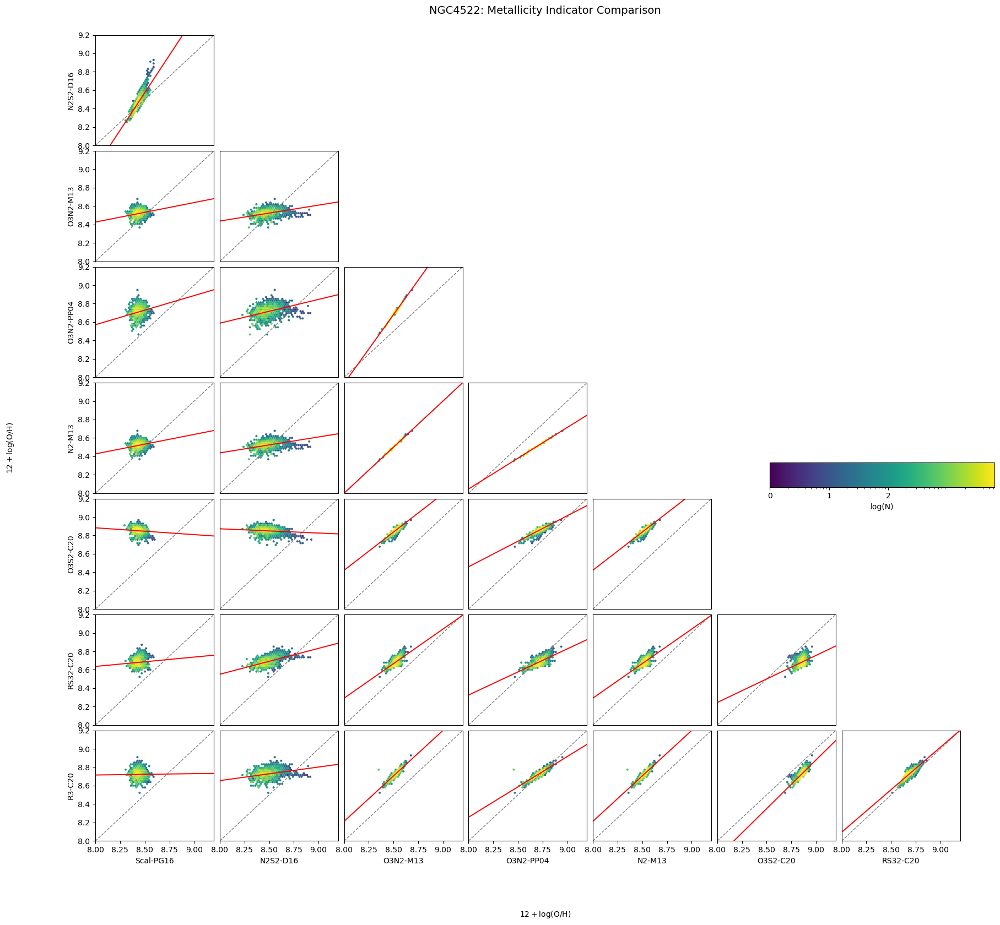

Processing NGC4694...


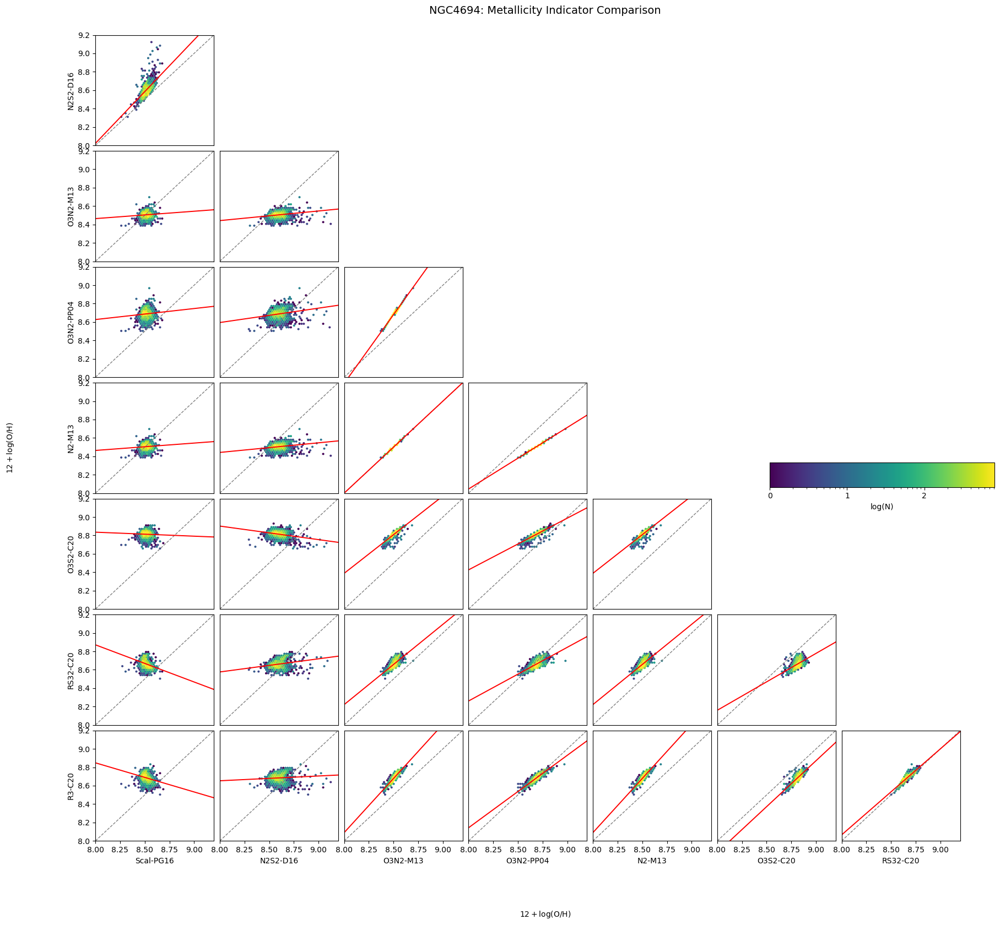

Processing NGC4698...


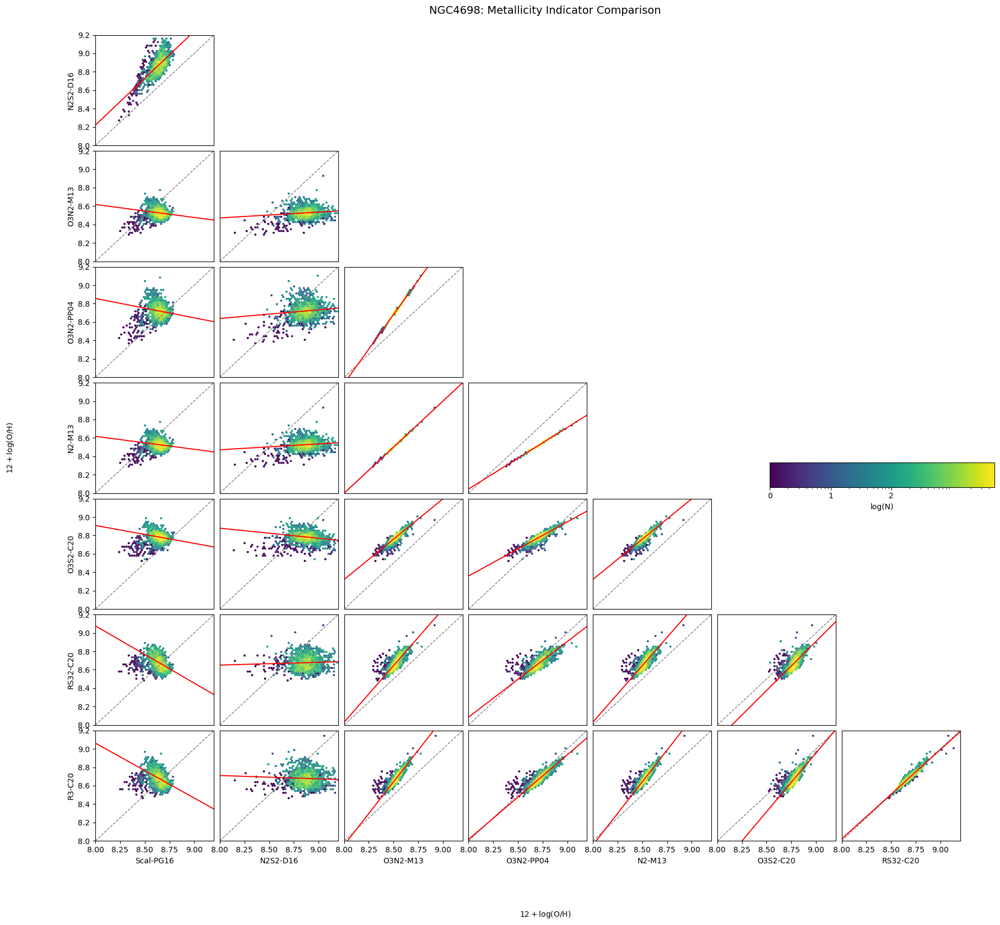

Finished processing all galaxies.


In [4]:
#!/usr/bin/env python3
# Metallicity indicator comparison across all galaxies
# - Layout/order matches your attached figure
# - Uses hexbin density, shared colorbar labeled log(N)
# - 1:1 dashed line + red linear fit in each populated panel

import re
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from astropy.io import fits
from scipy.stats import linregress

# Find all galaxies from FITS files
bin_maps = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bin_maps]        # auto-detect

# ---------- helpers ----------
def _norm(s: str) -> str:
    return re.sub(r"[^A-Z0-9]", "", str(s).upper())

def find_gas_fits(gal: str) -> Path:
    pats = [
        f"{gal}_gas_BIN_maps_extended.fits",
        f"{gal}*gas*BIN*maps*extended*.fits",
        f"{gal}*gas*maps*extended*.fits",
        f"{gal}*gas*maps*.fits",
    ]
    for pat in pats:
        for p in sorted(Path(".").glob(pat)):
            try:
                with open(p, "rb") as f:
                    if f.read(8).startswith(b"SIMPLE  "):
                        return p
            except Exception:
                pass
    raise FileNotFoundError("Could not find a valid gas FITS file for " + gal)

def find_hdu_name(hdul, tokens, prefer_sf=True):
    toks_all = [_norm(t) for t in tokens]
    toks_sf  = toks_all + (["SF"] if prefer_sf and "SF" not in toks_all else [])
    # try with SF
    for h in hdul:
        nm = _norm(h.name or "")
        if nm and all(t in nm for t in toks_sf):
            return h.name
    # fallback without SF
    for h in hdul:
        nm = _norm(h.name or "")
        if nm and all(t in nm for t in toks_all):
            return h.name
    return None

def ensure_found(hdul, tokens):
    name = find_hdu_name(hdul, tokens, prefer_sf=True)
    # Accept RS32 vs R3S2
    if name is None and any(_norm(t) == "R3S2" for t in tokens):
        alt = ["RS32" if _norm(t) == "R3S2" else t for t in tokens]
        name = find_hdu_name(hdul, alt, prefer_sf=True)
    return name

# ---------- the exact order you asked for ----------
x_labels = ["Scal-PG16", "N2S2-D16", "O3N2-M13", "O3N2-PP04", "N2-M13", "O3S2-C20", "RS32-C20", "R3-C20"]
y_labels = x_labels[1:]  # remove the first; lower-triangle grid

# tokens for fuzzy EXTNAME matching
tokens_map = {
    "Scal-PG16":  ["O_H", "PG16"],
    "N2S2-D16":   ["O_H", "D16"],
    "O3N2-M13":   ["O_H", "M13",  "O3N2"],
    "O3N2-PP04":  ["O_H", "PP04", "O3N2"],
    "N2-M13":     ["O_H", "M13",  "N2"],
    "O3S2-C20":   ["O_H", "C20",  "O3S2"],
    "RS32-C20":   ["O_H", "C20",  "R3S2"],   # RS32 synonym handled
    "R3-C20":     ["O_H", "C20",  "R3"],
}

# Loop through all galaxies
for gal in galaxies:
    print(f"Processing {gal}...")
    try:
        # ---------- load maps ----------
        fits_path = find_gas_fits(gal)
        with fits.open(fits_path) as hdul:
            maps = {}
            for lab in x_labels:
                name = ensure_found(hdul, tokens_map[lab])
                if name is None:
                    print(f"Warning: Could not find HDU for {lab} in {gal}")
                    continue
                arr = hdul[name].data
                if arr is None:
                    print(f"Warning: HDU {name} has no data in {gal}")
                    continue
                maps[lab] = np.asarray(arr, dtype=float)

        if not maps:
            print(f"Skipping {gal}: no valid metallicity maps found")
            continue

        # global nice limits (robust) shared by all panels
        all_vals = np.concatenate([np.ravel(m[np.isfinite(m)]) for m in maps.values()])
        if not all_vals.size:
            print(f"Skipping {gal}: no valid data points")
            continue
        
        Zmin, Zmax = 8.0, 9.2

        nx = len(x_labels)
        ny = len(y_labels)

        # Create figure with minimal spacing between subplots
        fig, axes = plt.subplots(ny, nx, figsize=(2.55*nx, 2.55*ny))
        if ny == 1:
            axes = np.array([axes])  # ensure 2D

        norm = LogNorm(vmin=1)
        cmap = plt.get_cmap("viridis")
        max_count = 1

        for i, yl in enumerate(y_labels):      # rows (y-variable)
            for j, xl in enumerate(x_labels):  # cols (x-variable)
                ax = axes[i, j]
                if j > i:          # ensure lower triangle (including first column)
                    ax.remove()  # Remove unused axes completely
                    continue

                if xl not in maps or yl not in maps:
                    ax.remove()  # Remove axes if either map is missing
                    continue

                x = maps[xl]; y = maps[yl]
                good = np.isfinite(x) & np.isfinite(y)
                xv = x[good].ravel(); yv = y[good].ravel()
                sel = (xv >= Zmin) & (xv <= Zmax) & (yv >= Zmin) & (yv <= Zmax)
                xv, yv = xv[sel], yv[sel]

                if xv.size == 0:
                    ax.remove()  # Remove empty axes
                    continue

                hb = ax.hexbin(
                    xv, yv, gridsize=55, extent=(Zmin, Zmax, Zmin, Zmax),
                    mincnt=1, linewidths=0.0, norm=norm, cmap=cmap
                )
                if hb.get_array().size:
                    max_count = max(max_count, float(hb.get_array().max()))

                # 1:1 dashed
                ax.plot([Zmin, Zmax], [Zmin, Zmax], ls="--", lw=1, color="0.5")

                # Linear fit (red)
                try:
                    slope, intercept, *_ = linregress(xv, yv)
                    xx = np.linspace(Zmin, Zmax, 200)
                    ax.plot(xx, intercept + slope*xx, color="red", lw=1.4)
                except Exception:
                    pass

                ax.set_xlim(Zmin, Zmax)
                ax.set_ylim(Zmin, Zmax)
                ax.grid(False)

                # Minimal ticks and labels for interior plots
                if j == 0:
                    ax.set_ylabel(yl, fontsize=10)
                else:
                    ax.set_yticklabels([])
                    ax.tick_params(left=False)  # Remove tick marks
                if i == ny - 1:
                    ax.set_xlabel(xl, fontsize=10)
                else:
                    ax.set_xticklabels([])
                    ax.tick_params(bottom=False)  # Remove tick marks

        # Add title
        fig.suptitle(f'{gal}: Metallicity Indicator Comparison', fontsize=14, y=0.95)

        # Global axis titles with adjusted positions
        fig.text(0.5, 0.02, r"$12+\log(\mathrm{O/H})$", ha="center", va="bottom")
        fig.text(0.02, 0.5, r"$12+\log(\mathrm{O/H})$", ha="left", va="center", rotation="vertical")

        # Shared horizontal colorbar with adjusted position
        from matplotlib.cm import ScalarMappable
        mappable = ScalarMappable(norm=LogNorm(vmin=1, vmax=max_count), cmap=cmap)
        cax = fig.add_axes([0.70, 0.46, 0.20, 0.025])  # [left, bottom, width, height]
        cb = plt.colorbar(mappable, cax=cax, orientation="horizontal")
        cb.set_label("log(N)")
        cb.set_ticks([1, 10, 100])
        cb.set_ticklabels(["0", "1", "2"])

        # Tighter layout with space for title and labels
        plt.subplots_adjust(left=0.1, right=0.98, bottom=0.1, top=0.92, wspace=0.05, hspace=0.05)
        plt.show()
        
    except Exception as e:
        print(f"Error processing {gal}: {e}")
        continue

print("Finished processing all galaxies.")

Found 14 galaxies: ['IC3392', 'NGC4064', 'NGC4192', 'NGC4293', 'NGC4298', 'NGC4330', 'NGC4383', 'NGC4396', 'NGC4419', 'NGC4457', 'NGC4501', 'NGC4522', 'NGC4694', 'NGC4698']
Loading data from IC3392...
Loading data from NGC4064...
Loading data from NGC4192...
Loading data from NGC4293...
Loading data from NGC4298...
Loading data from NGC4330...
Loading data from NGC4383...
Loading data from NGC4396...
Loading data from NGC4419...
Loading data from NGC4457...
Loading data from NGC4501...
Loading data from NGC4522...
Loading data from NGC4694...
Loading data from NGC4698...
Data loaded. Sample sizes:
  Scal-PG16: 1249620 points
  N2S2-D16: 1246932 points
  O3N2-M13: 1246932 points
  O3N2-PP04: 1246916 points
  N2-M13: 1246932 points
  O3S2-C20: 1245160 points
  RS32-C20: 1248771 points
  R3-C20: 1252169 points
Creating combined plot...
Panel N2S2-D16 vs Scal-PG16: 1245452 data points
Panel O3N2-M13 vs Scal-PG16: 1246919 data points
Panel O3N2-M13 vs N2S2-D16: 1245465 data points
Panel O3N

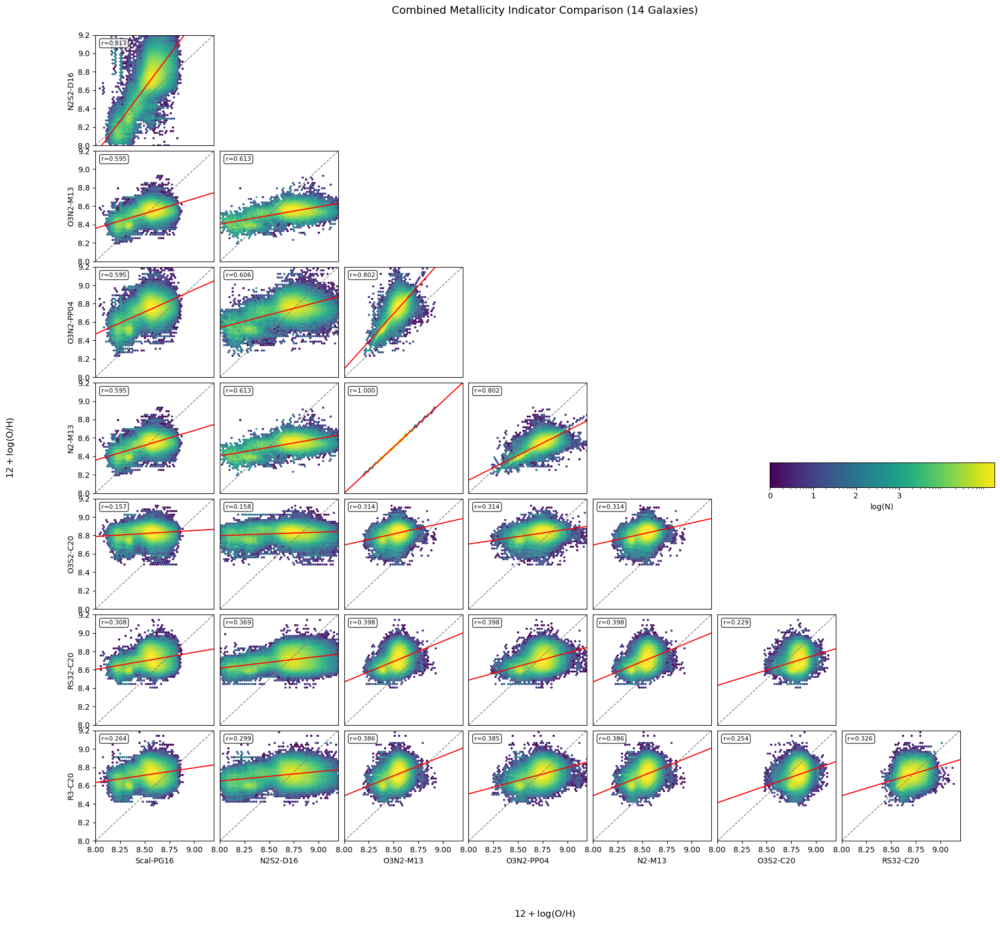

Finished creating combined metallicity comparison plot.


In [5]:
#!/usr/bin/env python3
# Combined metallicity indicator comparison across ALL galaxies in one plot
# - Layout/order matches your attached figure
# - Uses hexbin density, shared colorbar labeled log(N)
# - 1:1 dashed line + red linear fit in each populated panel
# - Combines data from all galaxies into single panels

import re
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from astropy.io import fits
from scipy.stats import linregress

# Find all galaxies from FITS files
bin_maps = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bin_maps]        # auto-detect

print(f"Found {len(galaxies)} galaxies: {galaxies}")

# ---------- helpers ----------
def _norm(s: str) -> str:
    return re.sub(r"[^A-Z0-9]", "", str(s).upper())

def find_gas_fits(gal: str) -> Path:
    pats = [
        f"{gal}_gas_BIN_maps_extended.fits",
        f"{gal}*gas*BIN*maps*extended*.fits",
        f"{gal}*gas*maps*extended*.fits",
        f"{gal}*gas*maps*.fits",
    ]
    for pat in pats:
        for p in sorted(Path(".").glob(pat)):
            try:
                with open(p, "rb") as f:
                    if f.read(8).startswith(b"SIMPLE  "):
                        return p
            except Exception:
                pass
    raise FileNotFoundError("Could not find a valid gas FITS file for " + gal)

def find_hdu_name(hdul, tokens, prefer_sf=True):
    toks_all = [_norm(t) for t in tokens]
    toks_sf  = toks_all + (["SF"] if prefer_sf and "SF" not in toks_all else [])
    # try with SF
    for h in hdul:
        nm = _norm(h.name or "")
        if nm and all(t in nm for t in toks_sf):
            return h.name
    # fallback without SF
    for h in hdul:
        nm = _norm(h.name or "")
        if nm and all(t in nm for t in toks_all):
            return h.name
    return None

def ensure_found(hdul, tokens):
    name = find_hdu_name(hdul, tokens, prefer_sf=True)
    # Accept RS32 vs R3S2
    if name is None and any(_norm(t) == "R3S2" for t in tokens):
        alt = ["RS32" if _norm(t) == "R3S2" else t for t in tokens]
        name = find_hdu_name(hdul, alt, prefer_sf=True)
    return name

# ---------- the exact order you asked for ----------
x_labels = ["Scal-PG16", "N2S2-D16", "O3N2-M13", "O3N2-PP04", "N2-M13", "O3S2-C20", "RS32-C20", "R3-C20"]
y_labels = x_labels[1:]  # remove the first; lower-triangle grid

# tokens for fuzzy EXTNAME matching
tokens_map = {
    "Scal-PG16":  ["O_H", "PG16"],
    "N2S2-D16":   ["O_H", "D16"],
    "O3N2-M13":   ["O_H", "M13",  "O3N2"],
    "O3N2-PP04":  ["O_H", "PP04", "O3N2"],
    "N2-M13":     ["O_H", "M13",  "N2"],
    "O3S2-C20":   ["O_H", "C20",  "O3S2"],
    "RS32-C20":   ["O_H", "C20",  "R3S2"],   # RS32 synonym handled
    "R3-C20":     ["O_H", "C20",  "R3"],
}

# Initialize combined data storage
combined_maps = {lab: [] for lab in x_labels}

# Loop through all galaxies to collect data
for gal in galaxies:
    print(f"Loading data from {gal}...")
    try:
        # ---------- load maps ----------
        fits_path = find_gas_fits(gal)
        with fits.open(fits_path) as hdul:
            for lab in x_labels:
                name = ensure_found(hdul, tokens_map[lab])
                if name is None:
                    print(f"Warning: Could not find HDU for {lab} in {gal}")
                    continue
                arr = hdul[name].data
                if arr is None:
                    print(f"Warning: HDU {name} has no data in {gal}")
                    continue
                # Store valid data points
                valid_data = np.asarray(arr, dtype=float)
                finite_mask = np.isfinite(valid_data)
                if np.any(finite_mask):
                    combined_maps[lab].extend(valid_data[finite_mask].ravel())
        
    except Exception as e:
        print(f"Error processing {gal}: {e}")
        continue

# Convert lists to numpy arrays
for lab in x_labels:
    if combined_maps[lab]:
        combined_maps[lab] = np.array(combined_maps[lab])
    else:
        combined_maps[lab] = np.array([])

print(f"Data loaded. Sample sizes:")
for lab in x_labels:
    print(f"  {lab}: {len(combined_maps[lab])} points")

# Check if we have any data
if not any(len(combined_maps[lab]) > 0 for lab in x_labels):
    print("No valid data found across all galaxies!")
    exit(1)

# Global nice limits (robust) shared by all panels
all_vals = np.concatenate([combined_maps[lab] for lab in x_labels if len(combined_maps[lab]) > 0])
if not all_vals.size:
    print("No valid data points found")
    exit(1)

Zmin, Zmax = 8.0, 9.2

nx = len(x_labels)
ny = len(y_labels)

# Create figure with minimal spacing between subplots
fig, axes = plt.subplots(ny, nx, figsize=(2.55*nx, 2.55*ny))
if ny == 1:
    axes = np.array([axes])  # ensure 2D

norm = LogNorm(vmin=1)
cmap = plt.get_cmap("viridis")
max_count = 1

print("Creating combined plot...")

for i, yl in enumerate(y_labels):      # rows (y-variable)
    for j, xl in enumerate(x_labels):  # cols (x-variable)
        ax = axes[i, j]
        if j > i:          # ensure lower triangle (including first column)
            ax.remove()  # Remove unused axes completely
            continue

        if len(combined_maps[xl]) == 0 or len(combined_maps[yl]) == 0:
            ax.remove()  # Remove axes if either map is missing
            continue

        # Get combined data from all galaxies
        x_data = combined_maps[xl]
        y_data = combined_maps[yl]
        
        # Create matching pairs (take minimum length)
        min_len = min(len(x_data), len(y_data))
        if min_len == 0:
            ax.remove()
            continue
            
        # For proper pairing, we need to ensure we're comparing the same spatial regions
        # Since we concatenated all galaxy data, we'll use all available pairs
        # This assumes the data arrays have compatible structures
        xv, yv = x_data[:min_len], y_data[:min_len]
        
        # Apply range selection
        sel = (xv >= Zmin) & (xv <= Zmax) & (yv >= Zmin) & (yv <= Zmax)
        xv, yv = xv[sel], yv[sel]

        if xv.size == 0:
            ax.remove()  # Remove empty axes
            continue

        print(f"Panel {yl} vs {xl}: {len(xv)} data points")

        hb = ax.hexbin(
            xv, yv, gridsize=55, extent=(Zmin, Zmax, Zmin, Zmax),
            mincnt=1, linewidths=0.0, norm=norm, cmap=cmap
        )
        if hb.get_array().size:
            max_count = max(max_count, float(hb.get_array().max()))

        # 1:1 dashed
        ax.plot([Zmin, Zmax], [Zmin, Zmax], ls="--", lw=1, color="0.5")

        # Linear fit (red)
        try:
            slope, intercept, r_value, *_ = linregress(xv, yv)
            xx = np.linspace(Zmin, Zmax, 200)
            ax.plot(xx, intercept + slope*xx, color="red", lw=1.4)
            # Add correlation coefficient as text
            ax.text(0.05, 0.95, f'r={r_value:.3f}', transform=ax.transAxes, 
                   fontsize=8, verticalalignment='top', 
                   bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8))
        except Exception as e:
            print(f"Could not fit line for {yl} vs {xl}: {e}")
            pass

        ax.set_xlim(Zmin, Zmax)
        ax.set_ylim(Zmin, Zmax)
        ax.grid(False)

        # Minimal ticks and labels for interior plots
        if j == 0:
            ax.set_ylabel(yl, fontsize=10)
        else:
            ax.set_yticklabels([])
            ax.tick_params(left=False)  # Remove tick marks
        if i == ny - 1:
            ax.set_xlabel(xl, fontsize=10)
        else:
            ax.set_xticklabels([])
            ax.tick_params(bottom=False)  # Remove tick marks

# Add title
fig.suptitle(f'Combined Metallicity Indicator Comparison ({len(galaxies)} Galaxies)', fontsize=14, y=0.95)

# Global axis titles with adjusted positions
fig.text(0.5, 0.02, r"$12+\log(\mathrm{O/H})$", ha="center", va="bottom", fontsize=12)
fig.text(0.02, 0.5, r"$12+\log(\mathrm{O/H})$", ha="left", va="center", rotation="vertical", fontsize=12)

# Shared horizontal colorbar with adjusted position
from matplotlib.cm import ScalarMappable
mappable = ScalarMappable(norm=LogNorm(vmin=1, vmax=max_count), cmap=cmap)
cax = fig.add_axes([0.70, 0.46, 0.20, 0.025])  # [left, bottom, width, height]
cb = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cb.set_label("log(N)", fontsize=10)
cb.set_ticks([1, 10, 100, 1000])
cb.set_ticklabels(["0", "1", "2", "3"])

# Tighter layout with space for title and labels
plt.subplots_adjust(left=0.1, right=0.98, bottom=0.1, top=0.92, wspace=0.05, hspace=0.05)

print(f"Plot created with data from {len(galaxies)} galaxies")
print(f"Maximum bin count: {max_count}")
plt.show()

print("Finished creating combined metallicity comparison plot.")

Found 14 galaxies: ['IC3392', 'NGC4064', 'NGC4192', 'NGC4293', 'NGC4298', 'NGC4330', 'NGC4383', 'NGC4396', 'NGC4419', 'NGC4457', 'NGC4501', 'NGC4522', 'NGC4694', 'NGC4698']
Loading data from IC3392...
Loading data from NGC4064...
Loading data from NGC4192...
Loading data from NGC4293...
Loading data from NGC4298...
Loading data from NGC4330...
Loading data from NGC4383...
Loading data from NGC4396...
Loading data from NGC4419...
Loading data from NGC4457...
Loading data from NGC4501...
Loading data from NGC4522...
Loading data from NGC4694...
Loading data from NGC4698...
Data loaded. Sample sizes:
  Scal-PG16: 1249620 points
  N2S2-D16: 1246932 points
  O3N2-M13: 1246932 points
  O3N2-PP04: 1246916 points
  N2-M13: 1246932 points
  O3S2-C20: 1245160 points
  RS32-C20: 1248771 points
  R3-C20: 1252169 points
Creating combined plot...
Plot created with data from 14 galaxies
Maximum bin count: 161431.0


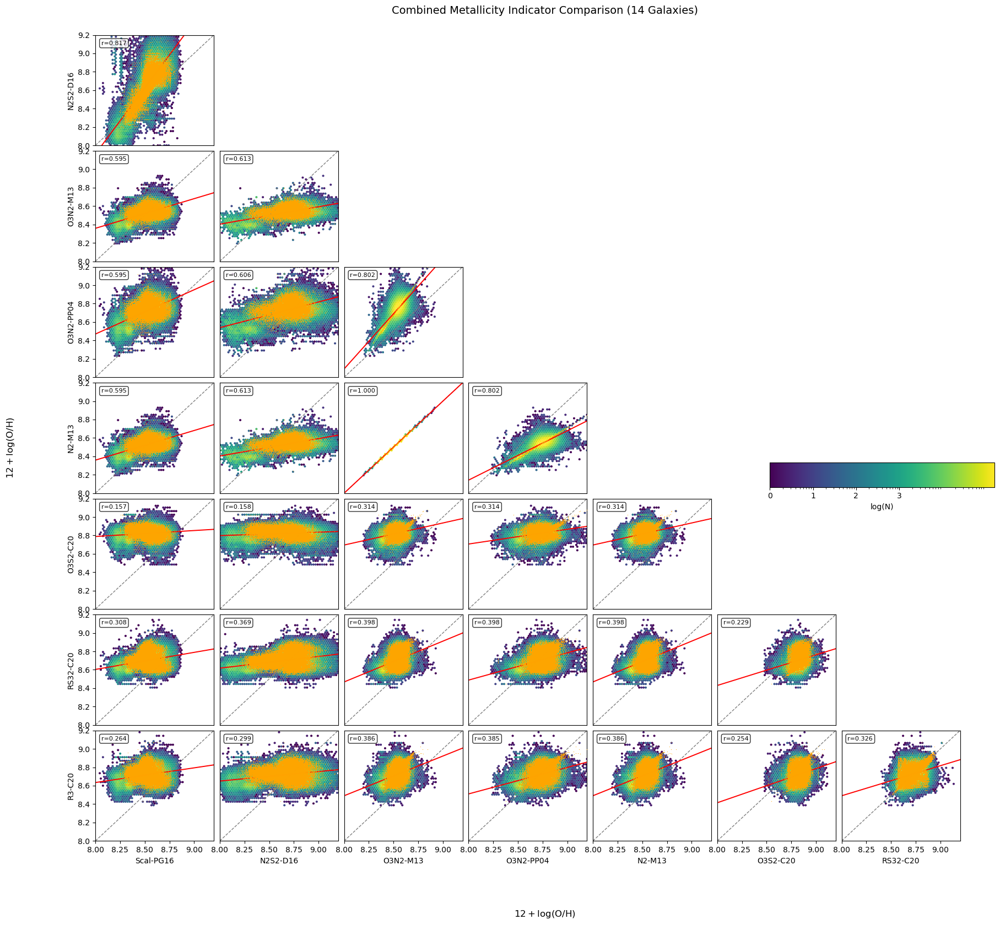

Finished creating combined metallicity comparison plot.


In [6]:
#!/usr/bin/env python3
# Combined metallicity indicator comparison across ALL galaxies in one plot
# - Layout/order matches your attached figure
# - Uses hexbin density, shared colorbar labeled log(N)
# - 1:1 dashed line + red linear fit in each populated panel
# - Combines data from all galaxies into single panels
# - NEW: overlay spaxels from selected galaxies in orange

import re
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from astropy.io import fits
from scipy.stats import linregress

# Find all galaxies from FITS files
bin_maps = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bin_maps]        # auto-detect

print(f"Found {len(galaxies)} galaxies: {galaxies}")

# -------- NEW: galaxies to highlight (orange overlay) ----------
highlight_galaxies = set(["IC3392", "NGC4064", "NGC4298", "NGC4330", "NGC4522", "NGC4694"])

# ---------- helpers ----------
def _norm(s: str) -> str:
    return re.sub(r"[^A-Z0-9]", "", str(s).upper())

def find_gas_fits(gal: str) -> Path:
    pats = [
        f"{gal}_gas_BIN_maps_extended.fits",
        f"{gal}*gas*BIN*maps*extended*.fits",
        f"{gal}*gas*maps*extended*.fits",
        f"{gal}*gas*maps*.fits",
    ]
    for pat in pats:
        for p in sorted(Path(".").glob(pat)):
            try:
                with open(p, "rb") as f:
                    if f.read(8).startswith(b"SIMPLE  "):
                        return p
            except Exception:
                pass
    raise FileNotFoundError("Could not find a valid gas FITS file for " + gal)

def find_hdu_name(hdul, tokens, prefer_sf=True):
    toks_all = [_norm(t) for t in tokens]
    toks_sf  = toks_all + (["SF"] if prefer_sf and "SF" not in toks_all else [])
    # try with SF
    for h in hdul:
        nm = _norm(h.name or "")
        if nm and all(t in nm for t in toks_sf):
            return h.name
    # fallback without SF
    for h in hdul:
        nm = _norm(h.name or "")
        if nm and all(t in nm for t in toks_all):
            return h.name
    return None

def ensure_found(hdul, tokens):
    name = find_hdu_name(hdul, tokens, prefer_sf=True)
    # Accept RS32 vs R3S2
    if name is None and any(_norm(t) == "R3S2" for t in tokens):
        alt = ["RS32" if _norm(t) == "R3S2" else t for t in tokens]
        name = find_hdu_name(hdul, alt, prefer_sf=True)
    return name

# ---------- the exact order you asked for ----------
x_labels = ["Scal-PG16", "N2S2-D16", "O3N2-M13", "O3N2-PP04", "N2-M13", "O3S2-C20", "RS32-C20", "R3-C20"]
y_labels = x_labels[1:]  # remove the first; lower-triangle grid

# tokens for fuzzy EXTNAME matching
tokens_map = {
    "Scal-PG16":  ["O_H", "PG16"],
    "N2S2-D16":   ["O_H", "D16"],
    "O3N2-M13":   ["O_H", "M13",  "O3N2"],
    "O3N2-PP04":  ["O_H", "PP04", "O3N2"],
    "N2-M13":     ["O_H", "M13",  "N2"],
    "O3S2-C20":   ["O_H", "C20",  "O3S2"],
    "RS32-C20":   ["O_H", "C20",  "R3S2"],   # RS32 synonym handled
    "R3-C20":     ["O_H", "C20",  "R3"],
}

# Initialize combined data storage
combined_maps = {lab: [] for lab in x_labels}

# -------- NEW: per-galaxy storage for highlights only ----------
highlight_maps = {g: {lab: None for lab in x_labels} for g in highlight_galaxies}

# Loop through all galaxies to collect data
for gal in galaxies:
    print(f"Loading data from {gal}...")
    try:
        fits_path = find_gas_fits(gal)
        with fits.open(fits_path) as hdul:
            for lab in x_labels:
                name = ensure_found(hdul, tokens_map[lab])
                if name is None:
                    print(f"Warning: Could not find HDU for {lab} in {gal}")
                    continue
                arr = hdul[name].data
                if arr is None:
                    print(f"Warning: HDU {name} has no data in {gal}")
                    continue
                valid_data = np.asarray(arr, dtype=float)
                finite_mask = np.isfinite(valid_data)
                if np.any(finite_mask):
                    flat = valid_data[finite_mask].ravel()
                    combined_maps[lab].extend(flat.tolist())
                    # -------- NEW: keep per-gal arrays for highlight galaxies --------
                    if gal in highlight_galaxies:
                        highlight_maps[gal][lab] = flat
    except Exception as e:
        print(f"Error processing {gal}: {e}")
        continue

# Convert lists to numpy arrays
for lab in x_labels:
    if combined_maps[lab]:
        combined_maps[lab] = np.array(combined_maps[lab])
    else:
        combined_maps[lab] = np.array([])

print(f"Data loaded. Sample sizes:")
for lab in x_labels:
    print(f"  {lab}: {len(combined_maps[lab])} points")

# Check if we have any data
if not any(len(combined_maps[lab]) > 0 for lab in x_labels):
    print("No valid data found across all galaxies!")
    raise SystemExit(1)

# Global nice limits (fixed to match your taste)
Zmin, Zmax = 8.0, 9.2

nx = len(x_labels)
ny = len(y_labels)

# Create figure with minimal spacing between subplots
fig, axes = plt.subplots(ny, nx, figsize=(2.55*nx, 2.55*ny))
if ny == 1:
    axes = np.array([axes])  # ensure 2D

norm = LogNorm(vmin=1)
cmap = plt.get_cmap("viridis")
max_count = 1

print("Creating combined plot...")

for i, yl in enumerate(y_labels):      # rows (y-variable)
    for j, xl in enumerate(x_labels):  # cols (x-variable)
        ax = axes[i, j]
        if j > i:          # ensure lower triangle (including first column)
            ax.remove()
            continue

        if len(combined_maps[xl]) == 0 or len(combined_maps[yl]) == 0:
            ax.remove()
            continue

        # Pair combined arrays (same assumption as original code)
        min_len = min(len(combined_maps[xl]), len(combined_maps[yl]))
        if min_len == 0:
            ax.remove()
            continue

        xv = combined_maps[xl][:min_len]
        yv = combined_maps[yl][:min_len]
        sel = (xv >= Zmin) & (xv <= Zmax) & (yv >= Zmin) & (yv <= Zmax)
        xv, yv = xv[sel], yv[sel]
        if xv.size == 0:
            ax.remove()
            continue

        hb = ax.hexbin(
            xv, yv, gridsize=55, extent=(Zmin, Zmax, Zmin, Zmax),
            mincnt=1, linewidths=0.0, norm=norm, cmap=cmap
        )
        if hb.get_array().size:
            max_count = max(max_count, float(hb.get_array().max()))

        # 1:1 dashed
        ax.plot([Zmin, Zmax], [Zmin, Zmax], ls="--", lw=1, color="0.5")

        # Linear fit (red)
        try:
            slope, intercept, r_value, *_ = linregress(xv, yv)
            xx = np.linspace(Zmin, Zmax, 200)
            ax.plot(xx, intercept + slope*xx, color="red", lw=1.4)
            ax.text(0.05, 0.95, f'r={r_value:.3f}', transform=ax.transAxes,
                    fontsize=8, va='top',
                    bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8))
        except Exception as e:
            print(f"Could not fit line for {yl} vs {xl}: {e}")

        # -------- NEW: overlay orange points for highlighted galaxies --------
        for g in highlight_galaxies:
            gx = highlight_maps.get(g, {}).get(xl, None)
            gy = highlight_maps.get(g, {}).get(yl, None)
            if gx is None or gy is None:
                continue
            m = min(len(gx), len(gy))
            if m == 0:
                continue
            xg, yg = gx[:m], gy[:m]
            msel = (xg >= Zmin) & (xg <= Zmax) & (yg >= Zmin) & (yg <= Zmax)
            xg, yg = xg[msel], yg[msel]
            if xg.size:
                ax.scatter(xg, yg, s=2, c='orange', alpha=0.6, marker='.', lw=0,
                           zorder=3, rasterized=True)

        ax.set_xlim(Zmin, Zmax)
        ax.set_ylim(Zmin, Zmax)
        ax.grid(False)

        # Minimal ticks and labels for interior plots
        if j == 0:
            ax.set_ylabel(yl, fontsize=10)
        else:
            ax.set_yticklabels([])
            ax.tick_params(left=False)
        if i == ny - 1:
            ax.set_xlabel(xl, fontsize=10)
        else:
            ax.set_xticklabels([])
            ax.tick_params(bottom=False)

# Title and shared labels
fig.suptitle(f'Combined Metallicity Indicator Comparison ({len(galaxies)} Galaxies)', fontsize=14, y=0.95)
fig.text(0.5, 0.02, r"$12+\log(\mathrm{O/H})$", ha="center", va="bottom", fontsize=12)
fig.text(0.02, 0.5, r"$12+\log(\mathrm{O/H})$", ha="left", va="center", rotation="vertical", fontsize=12)

# Shared horizontal colorbar
from matplotlib.cm import ScalarMappable
mappable = ScalarMappable(norm=LogNorm(vmin=1, vmax=max_count), cmap=cmap)
cax = fig.add_axes([0.70, 0.46, 0.20, 0.025])  # [left, bottom, width, height]
cb = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cb.set_label("log(N)", fontsize=10)
cb.set_ticks([1, 10, 100, 1000])
cb.set_ticklabels(["0", "1", "2", "3"])

plt.subplots_adjust(left=0.1, right=0.98, bottom=0.1, top=0.92, wspace=0.05, hspace=0.05)
print(f"Plot created with data from {len(galaxies)} galaxies")
print(f"Maximum bin count: {max_count}")
plt.show()

print("Finished creating combined metallicity comparison plot.")


[info] Found 14 galaxies: ['IC3392', 'NGC4064', 'NGC4192', 'NGC4293', 'NGC4298', 'NGC4330', 'NGC4383', 'NGC4396', 'NGC4419', 'NGC4457', 'NGC4501', 'NGC4522', 'NGC4694', 'NGC4698']


/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_86148/2812490037.py:249: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0.06, 0.02, 0.90, 0.96])


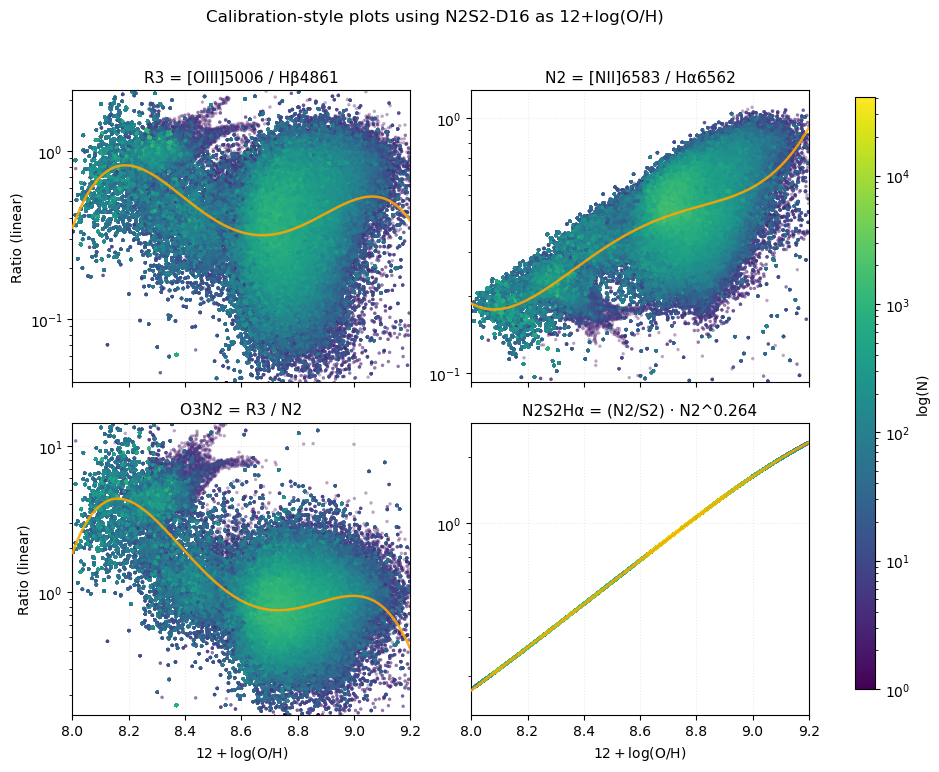

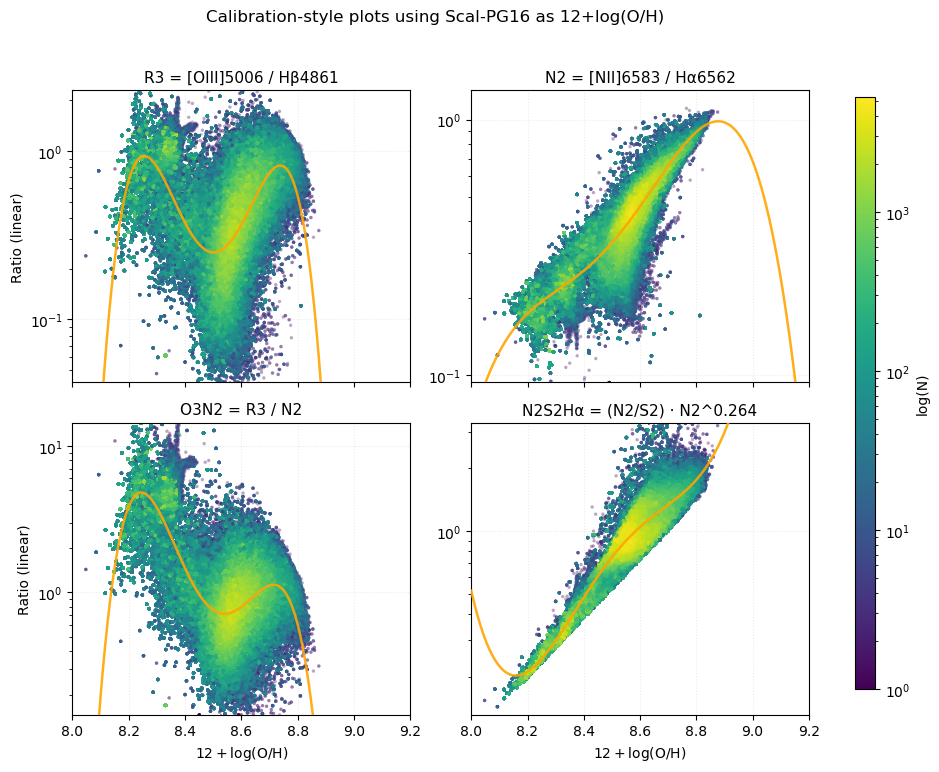

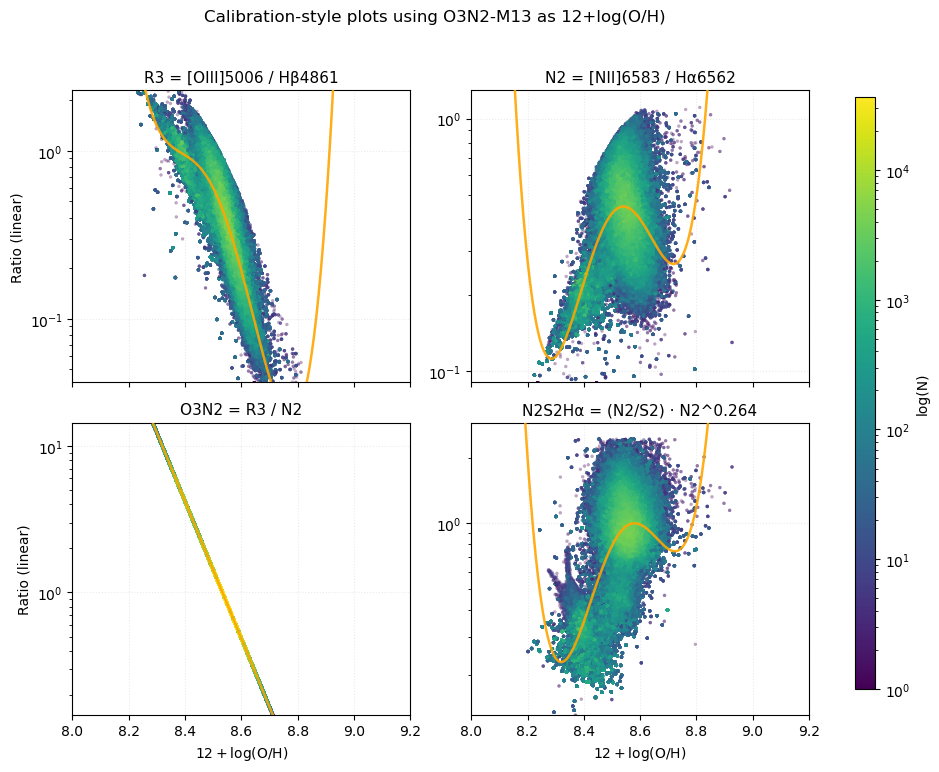

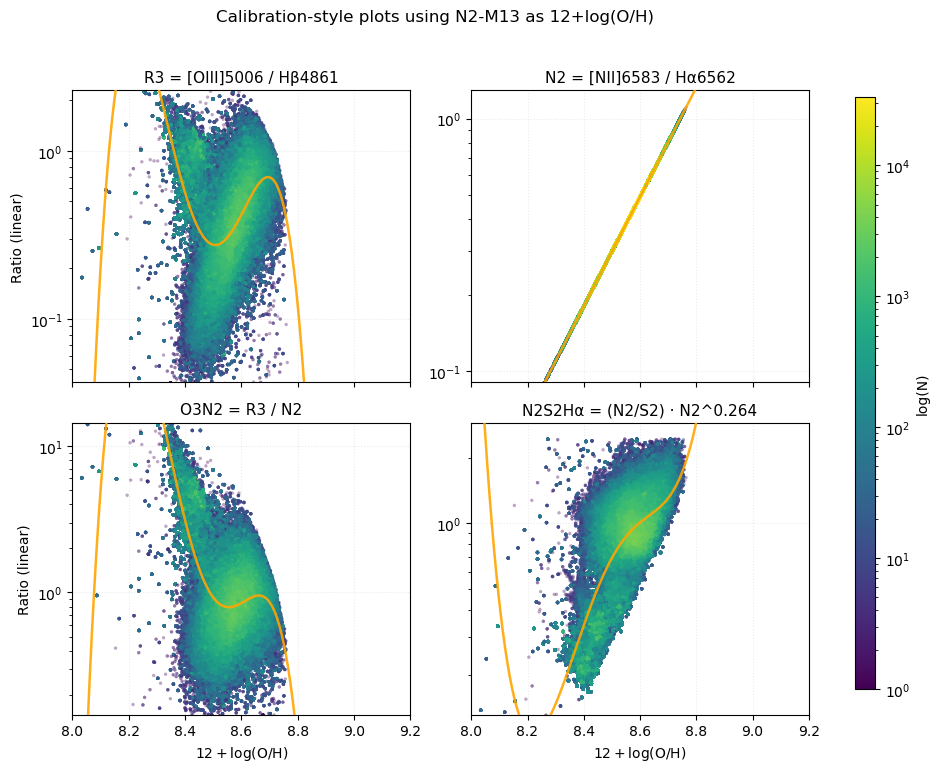

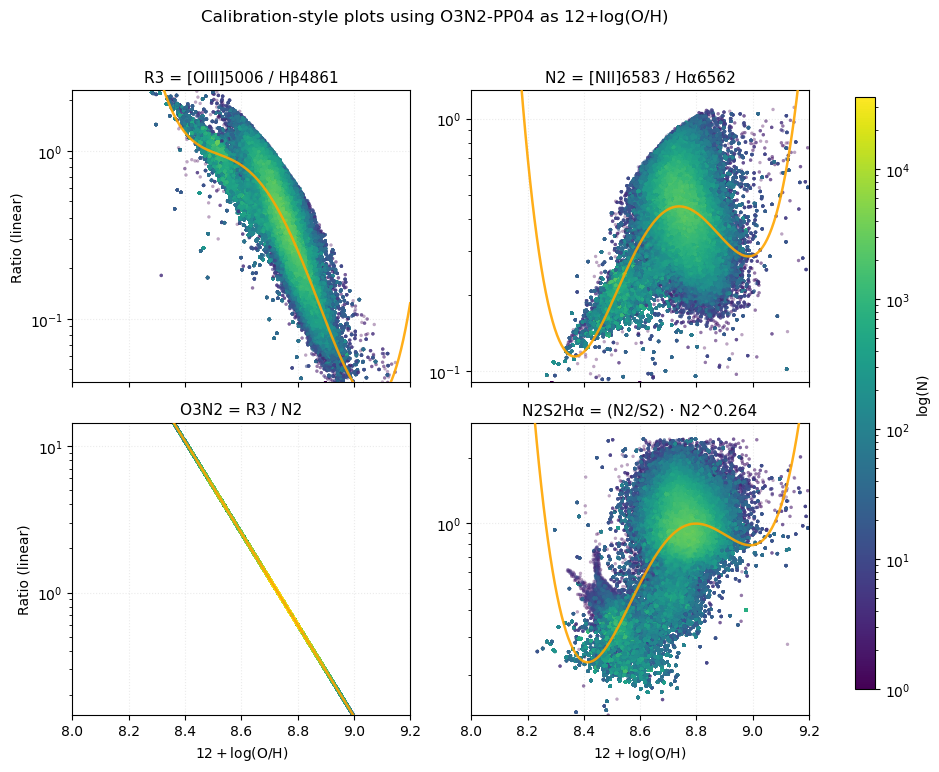

...

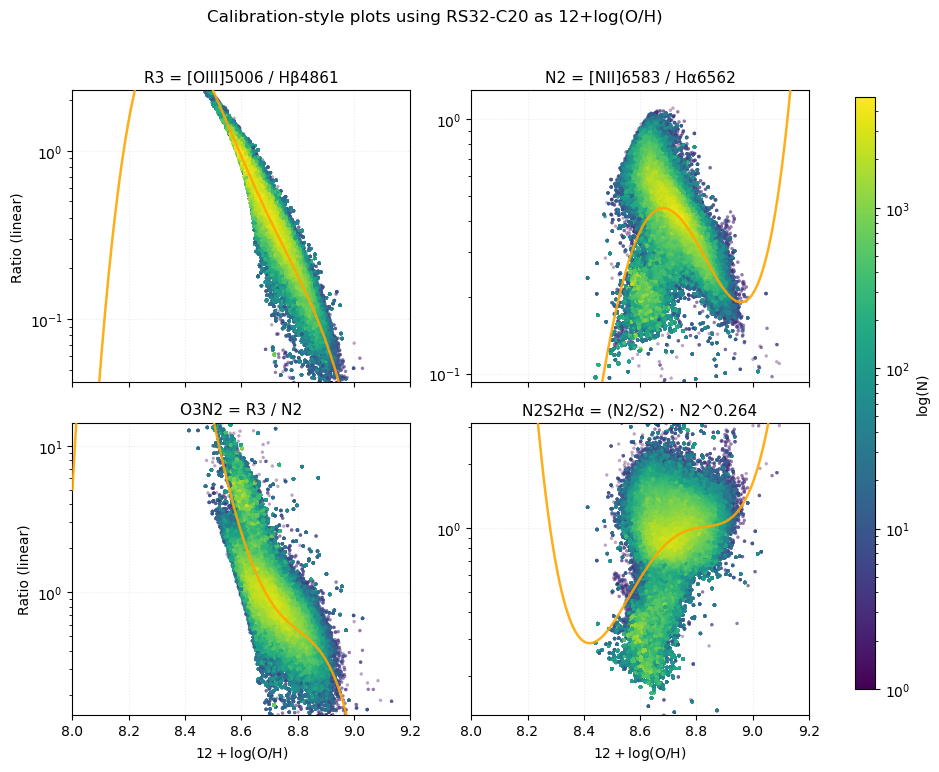

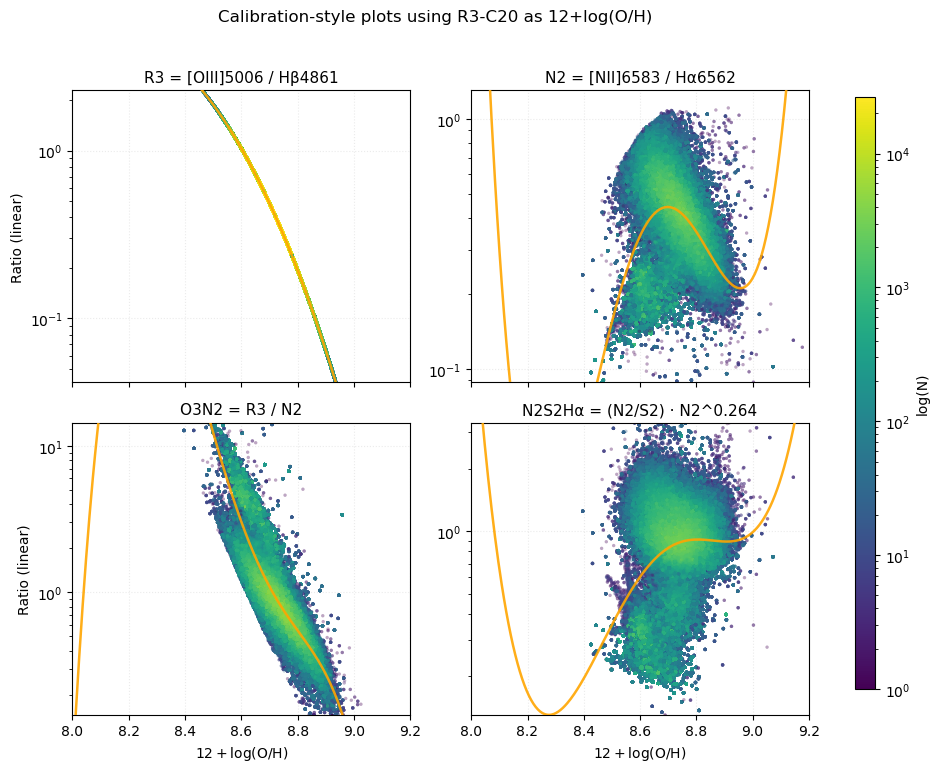

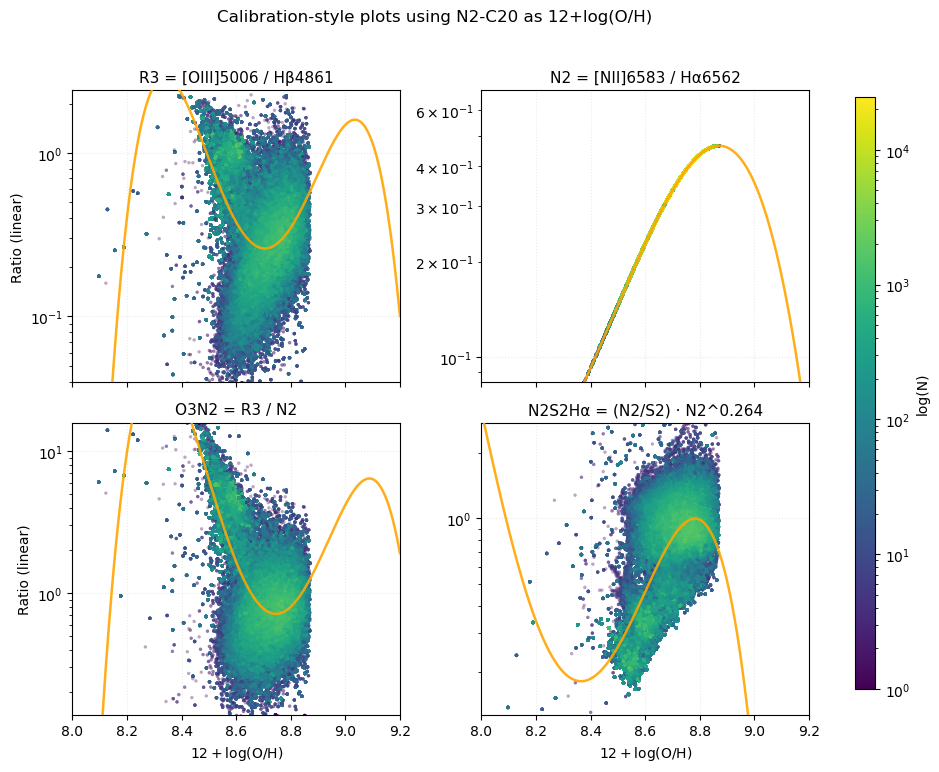

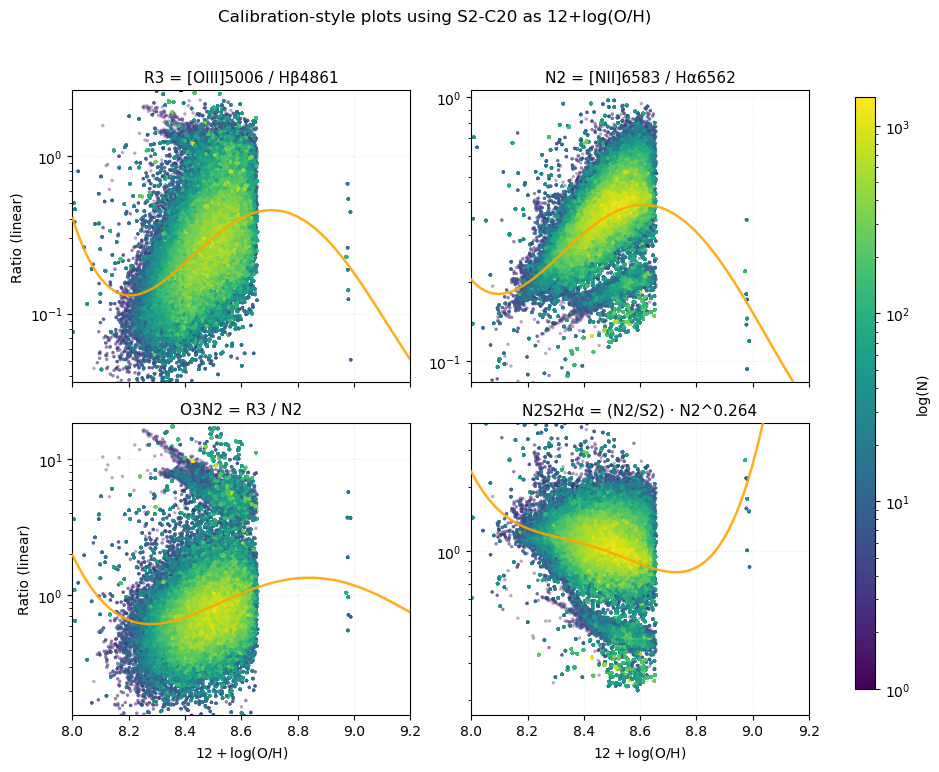

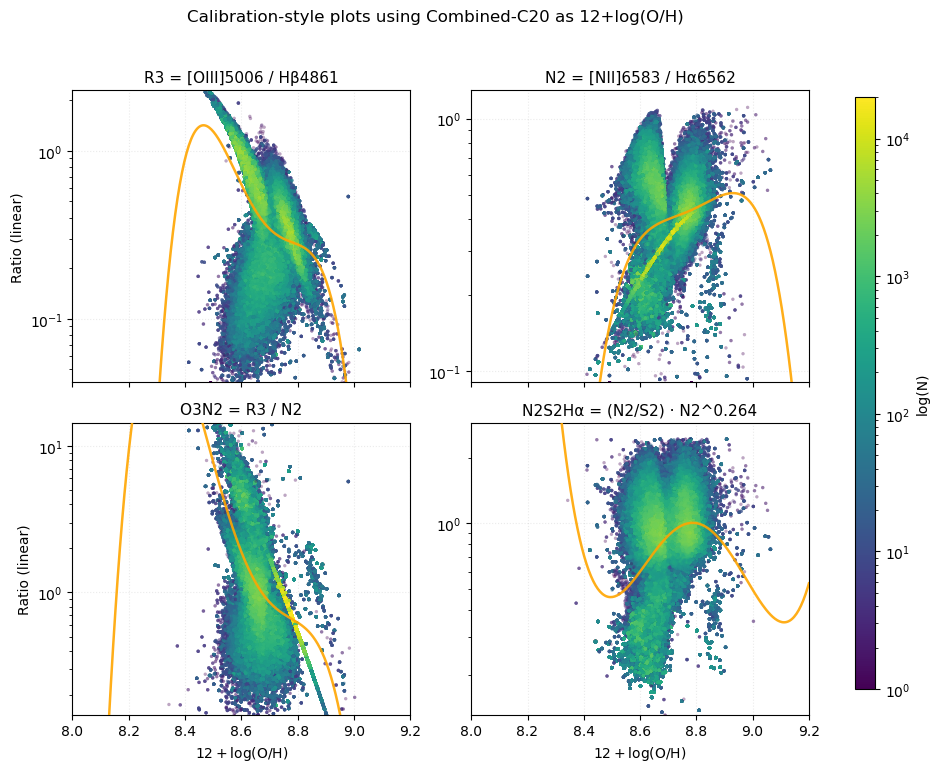

In [7]:
#!/usr/bin/env python3
# 4-panel calibration-style plots using *_FLUX_corr and O_H_*_SF HDUs
# - X range fixed to 8.0–9.2
# - Individual spaxels (scatter) colored by local density
# - One shared colorbar (LogNorm) across panels
# - 4th-order polynomial fit (in log-space) shown in orange
# - Loops over all metallicity maps you listed

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from matplotlib.cm import ScalarMappable
from pathlib import Path
from astropy.io import fits

# ----------------------------
# Discover galaxies
# ----------------------------
bin_maps = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bin_maps]
print(f"[info] Found {len(galaxies)} galaxies:", galaxies)

# ----------------------------
# Metallicities to iterate on (order can be changed)
# ----------------------------
METAL_EXTS = [
    "O_H_D16_SF",
    "O_H_PG16_SF",
    "O_H_O3N2_M13_SF",
    "O_H_N2_M13_SF",
    "O_H_O3N2_PP04_SF",
    "O_H_N2_PP04_SF",
    "O_H_O3N2_C20_SF",
    "O_H_O3S2_C20_SF",
    "O_H_RS32_C20_SF",   # synonym with O_H_R3S2_C20_SF handled below
    "O_H_R3_C20_SF",
    "O_H_N2_C20_SF",
    "O_H_S2_C20_SF",
    "O_H_COMBINED_C20_SF",
]

# ----------------------------
# Labels
# ----------------------------
def pretty_label(ext: str) -> str:
    core = ext.replace("O_H_", "").replace("_SF", "")
    core = (core.replace("O3N2_M13", "O3N2-M13")
                 .replace("N2_M13", "N2-M13")
                 .replace("O3N2_PP04", "O3N2-PP04")
                 .replace("N2_PP04", "N2-PP04")
                 .replace("O3N2_C20", "O3N2-C20")
                 .replace("O3S2_C20", "O3S2-C20")
                 .replace("RS32_C20", "RS32-C20")
                 .replace("R3S2_C20", "RS32-C20")
                 .replace("R3_C20", "R3-C20")
                 .replace("N2_C20", "N2-C20")
                 .replace("S2_C20", "S2-C20")
                 .replace("COMBINED_C20", "Combined-C20")
                 .replace("D16", "N2S2-D16")
                 .replace("PG16", "Scal-PG16"))
    return core

# ----------------------------
# Load one galaxy (your exact HDU names)
# ----------------------------
def load_one_galaxy(gal: str, oh_ext: str):
    """
    Returns:
      oh_map, R3, N2, S2 (S2 can be None if SII maps are missing)
    """
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        hb4861   = np.asarray(h['HB4861_FLUX_corr'].data, dtype=float)
        oiii5006 = np.asarray(h['OIII5006_FLUX_corr'].data, dtype=float)
        nii6583  = np.asarray(h['NII6583_FLUX_corr'].data, dtype=float)
        ha6562   = np.asarray(h['HA6562_FLUX_corr'].data, dtype=float)

        # Optional SII lines for N2S2Hα
        S2 = None
        try:
            sii6716 = np.asarray(h['SII6716_FLUX_corr'].data, dtype=float)
            sii6730 = np.asarray(h['SII6730_FLUX_corr'].data, dtype=float)
            with np.errstate(divide='ignore', invalid='ignore'):
                S2 = (sii6716 + sii6730) / ha6562
            S2[~np.isfinite(S2) | (S2 <= 0)] = np.nan
        except KeyError:
            pass

        # O/H map with RS32<->R3S2 fallback
        try:
            oh_map = np.asarray(h[oh_ext].data, dtype=float)
        except KeyError:
            if oh_ext == "O_H_RS32_C20_SF" and 'O_H_R3S2_C20_SF' in h:
                oh_map = np.asarray(h['O_H_R3S2_C20_SF'].data, dtype=float)
            elif oh_ext == "O_H_R3S2_C20_SF" and 'O_H_RS32_C20_SF' in h:
                oh_map = np.asarray(h['O_H_RS32_C20_SF'].data, dtype=float)
            else:
                return None, None, None, None

    with np.errstate(divide='ignore', invalid='ignore'):
        R3 = oiii5006 / hb4861
        N2 = nii6583  / ha6562
    R3[~np.isfinite(R3) | (R3 <= 0)] = np.nan
    N2[~np.isfinite(N2) | (N2 <= 0)] = np.nan
    oh_map[~np.isfinite(oh_map)] = np.nan

    return oh_map, R3, N2, S2

# ----------------------------
# Plot settings
# ----------------------------
XMIN, XMAX = 8.0, 9.2            # <- as requested
CMAP = "viridis"
BINS_X = 120                      # for density estimate
BINS_Y = 120

def robust_ylim(y):
    y = y[np.isfinite(y) & (y > 0)]
    if y.size == 0:
        return (1e-3, 1.0)
    lo, hi = np.nanpercentile(y, [0.5, 99.5])
    lo = max(lo/1.5, 1e-4)
    hi = min(hi*1.5, 1e4)
    if hi <= lo:
        hi = lo*10
    return (lo, hi)

def density_colours(x, y, xlim, ylim, bins_x=BINS_X, bins_y=BINS_Y):
    """
    Map each (x,y) to its 2D-binned count (log-y binning).
    Returns counts per point and the bin max (for colorbar scaling).
    """
    # Work in log10(y) for binning
    lx = x
    ly = np.log10(y)
    xedges = np.linspace(xlim[0], xlim[1], bins_x + 1)
    yedges = np.linspace(np.log10(ylim[0]), np.log10(ylim[1]), bins_y + 1)
    H, xe, ye = np.histogram2d(lx, ly, bins=[xedges, yedges])
    # indices of each point's bin
    xi = np.digitize(lx, xedges) - 1
    yi = np.digitize(ly, yedges) - 1
    # clip to valid
    xi = np.clip(xi, 0, H.shape[0]-1)
    yi = np.clip(yi, 0, H.shape[1]-1)
    counts = H[xi, yi]
    maxc = float(H.max()) if H.size else 1.0
    counts[counts < 1] = 1.0  # avoid zeros for LogNorm
    return counts, maxc

def scatter_panel(ax, x, y, title, norm, cmap):
    m = np.isfinite(x) & np.isfinite(y) & (y > 0) & (x >= XMIN) & (x <= XMAX)
    x, y = x[m], y[m]
    if x.size == 0:
        ax.set_visible(False); return 1

    ylo, yhi = robust_ylim(y)
    ax.set_yscale('log')
    ax.set_xlim(XMIN, XMAX)
    ax.set_ylim(ylo, yhi)
    ax.grid(True, ls=':', alpha=0.25)
    ax.set_title(title, fontsize=11)

    # Color by local density and track max for shared colorbar scaling
    counts, maxc = density_colours(x, y, (XMIN, XMAX), (ylo, yhi))
    sc = ax.scatter(x, y, c=counts, s=6, alpha=0.35, marker='o', linewidths=0,
                    rasterized=True, norm=norm, cmap=cmap, zorder=2)

    # 4th-order polynomial in log-space (log10(y) vs x)
    try:
        if x.size > 5:
            z = np.polyfit(x, np.log10(y), deg=4)
            xs = np.linspace(XMIN, XMAX, 300)
            ax.plot(xs, 10**np.polyval(z, xs), color='orange', lw=1.8, alpha=0.9, zorder=3)
    except Exception:
        pass

    return maxc

# ----------------------------
# Main loop over metallicity maps
# ----------------------------
for oh_ext in METAL_EXTS:
    X_list, R3_list, N2_list, S2_list = [], [], [], []

    for gal in galaxies:
        try:
            oh_map, R3, N2, S2 = load_one_galaxy(gal, oh_ext)
        except KeyError as e:
            print(f"[warn] {gal}: missing HDU {e}; skip for {oh_ext}")
            continue
        if oh_map is None:
            continue

        X_list.append(oh_map.ravel())
        R3_list.append(R3.ravel())
        N2_list.append(N2.ravel())
        S2_list.append(S2.ravel() if S2 is not None else None)

    if not X_list:
        print(f"[skip] No data for {oh_ext}")
        continue

    X_all  = np.concatenate(X_list)
    R3_all = np.concatenate(R3_list)
    N2_all = np.concatenate(N2_list)
    S2_all = (np.concatenate([a for a in S2_list if a is not None])
              if any(a is not None for a in S2_list) else None)

    O3N2_all   = R3_all / N2_all
    N2S2Ha_all = (N2_all / S2_all) * (N2_all ** 0.264) if S2_all is not None else None

    # Build figure and shared colorbar scaffolding
    fig, axs = plt.subplots(2, 2, figsize=(10, 8), sharex=True)
    fig.suptitle(f"Calibration-style plots using {pretty_label(oh_ext)} as 12+log(O/H)")

    cmap = plt.get_cmap(CMAP)
    # We'll compute a preliminary norm, then update vmax after panels report their maxima
    norm = LogNorm(vmin=1, vmax=10)  # temporary vmax; will fix after plotting
    panel_max = 1.0

    # Panels
    panel_max = max(panel_max, scatter_panel(axs[0,0], X_all, R3_all, "R3 = [OIII]5006 / Hβ4861", norm, cmap))
    panel_max = max(panel_max, scatter_panel(axs[0,1], X_all, N2_all, "N2 = [NII]6583 / Hα6562",  norm, cmap))
    panel_max = max(panel_max, scatter_panel(axs[1,0], X_all, O3N2_all, "O3N2 = R3 / N2",       norm, cmap))
    if N2S2Ha_all is not None:
        panel_max = max(panel_max, scatter_panel(axs[1,1], X_all, N2S2Ha_all, "N2S2Hα = (N2/S2) · N2^0.264", norm, cmap))
    else:
        axs[1,1].set_visible(False)

    # Now set the shared colorbar with the *final* vmax
    norm = LogNorm(vmin=1, vmax=panel_max)
    sm = ScalarMappable(norm=norm, cmap=cmap)
    # Replace each PathCollection's norm so the colors match the final colorbar
    for ax in axs.flat:
        for coll in ax.collections:
            coll.set_norm(norm)
            coll.set_cmap(cmap)

    # Shared colorbar (vertical on the right)
    cax = fig.add_axes([0.92, 0.13, 0.02, 0.74])   # [left, bottom, width, height]
    cb = plt.colorbar(sm, cax=cax, orientation="vertical")
    cb.set_label("log(N)")

    # Axes labels
    axs[1,0].set_xlabel(r"$12+\log(\mathrm{O/H})$")
    axs[1,1].set_xlabel(r"$12+\log(\mathrm{O/H})$")
    axs[0,0].set_ylabel("Ratio (linear)")
    axs[1,0].set_ylabel("Ratio (linear)")

    plt.tight_layout(rect=[0.06, 0.02, 0.90, 0.96])
    plt.show()
